### Data Shifting Experiment

### BRSET

* [Dataset](https://physionet.org/content/brazilian-ophthalmological/1.0.0/)

* [Original Paper](https://www.medrxiv.org/content/10.1101/2024.01.23.24301660v1)

In [ ]:
%cd ..

In [2]:
import os
import numpy as np
import pandas as pd

from src.classifiers import preprocess_data, process_labels, split_data
from src.classifiers import VQADataset
from torch.utils.data import DataLoader
from src.classifiers import train_early_fusion, train_late_fusion

from utils import normalize_embeddings, modify_and_normalize_embeddings, visualize_embeddings, plot_results

In [3]:
PATH = 'Embeddings_vlm/brset/'
FILE = 'embeddings_clip.csv'
DATASET = 'BRSET'

batch_size = 32

output_size = 3
multilabel = False

num_epochs = 100

In [4]:
df = pd.read_csv(os.path.join(PATH, FILE))
df.drop(columns=['image_id', 'text'], inplace=True)
df.DR_3 = df.DR_3.astype(str)
df.head()

,DR_ICDR,DR_2,DR_3,split,image_embedding_0,image_embedding_1,image_embedding_2,image_embedding_3,image_embedding_4,image_embedding_5,...,text_embedding_502,text_embedding_503,text_embedding_504,text_embedding_505,text_embedding_506,text_embedding_507,text_embedding_508,text_embedding_509,text_embedding_510,text_embedding_511
0,0,0,0,train,0.012998,-0.012632,0.010281,0.016375,-0.040752,-0.018974,...,-0.054316,0.026362,0.062661,0.023066,-0.023967,-0.013421,0.033898,-0.058343,0.027308,0.011322
1,0,0,0,test,0.013524,-0.017406,0.012482,0.012262,-0.039934,-0.022396,...,-0.054454,0.018202,0.061717,0.022467,-0.011161,-0.011376,0.030134,-0.049021,0.021231,0.010651
2,0,0,0,train,0.036357,-0.018087,-0.001801,0.010425,-0.036854,-0.019405,...,-0.055949,0.011358,0.072995,0.030307,-0.011789,-0.011042,0.042255,-0.057926,0.033326,0.018503
3,0,0,0,train,0.022021,-0.011668,0.010509,0.022121,-0.035989,-0.023524,...,-0.055314,0.002594,0.074490,0.034430,-0.000350,-0.007918,0.042707,-0.047150,0.027270,0.020940
4,0,0,0,test,0.018684,-0.010326,0.004721,0.006435,-0.045767,-0.025992,...,-0.052848,0.021930,0.068045,0.027663,-0.020903,-0.012616,0.037164,-0.051632,0.033358,0.013019


In [5]:
# Select features and labels vectors
text_columns = [column for column in df.columns if 'text' in column]
image_columns = [column for column in df.columns if 'image' in column]
label_columns = 'DR_3'

### Run Experiments

##################################################  Shift -1  ##################################################


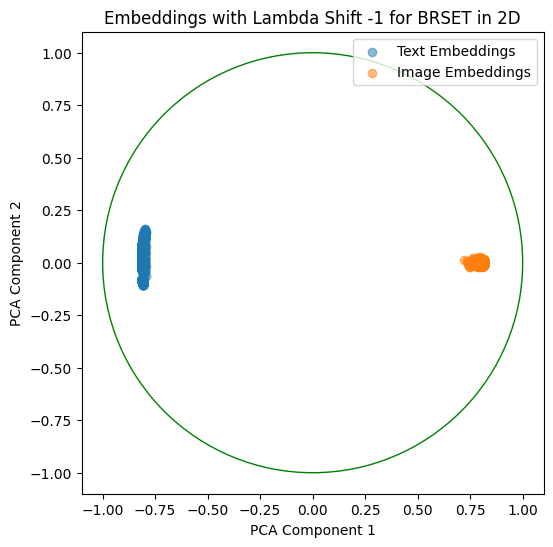

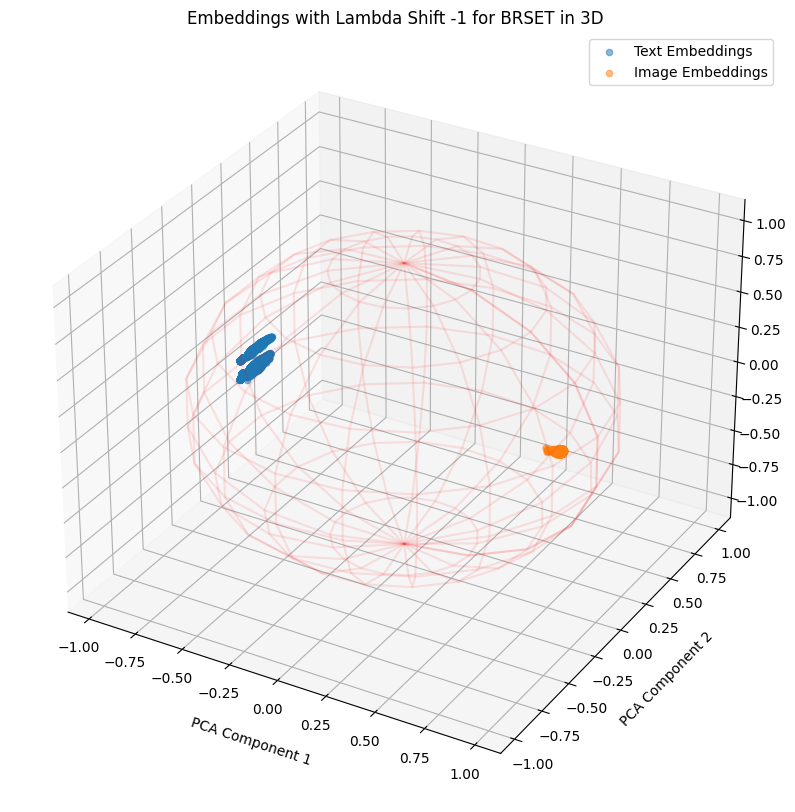

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.31 seconds
Total Training Time per Epoch: 130.71 seconds
Average Inference Time per Epoch: 0.27 seconds
Total Inference Time per Epoch: 26.73 seconds


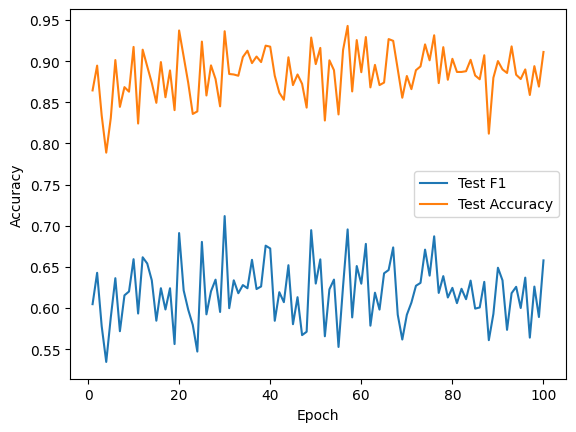

Best Accuracy: {'Acc': 0.942839582052858, 'F1': 0.6955752263017585, 'Epoch': 57}
Best Macro-F1: {'Acc': 0.9363859864781807, 'F1': 0.711777704185021, 'Epoch': 30}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 3.75 seconds
Total Training Time per Epoch: 375.11 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 59.29 seconds


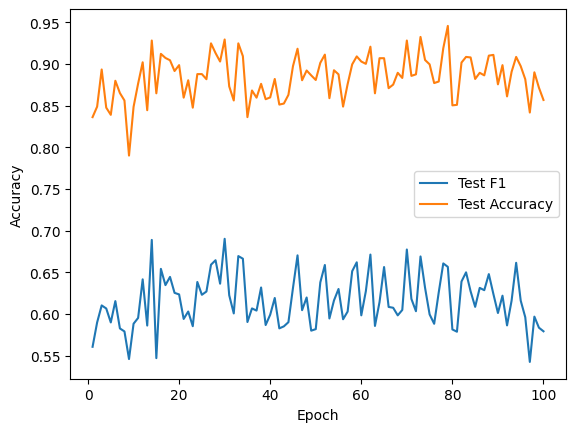

Best Accuracy: {'Acc': 0.9456054087277197, 'F1': 0.6566304884941266, 'Epoch': 79}
Best Macro-F1: {'Acc': 0.9293177627535341, 'F1': 0.6902783383326523, 'Epoch': 30}
##################################################  Shift -0.9  ##################################################


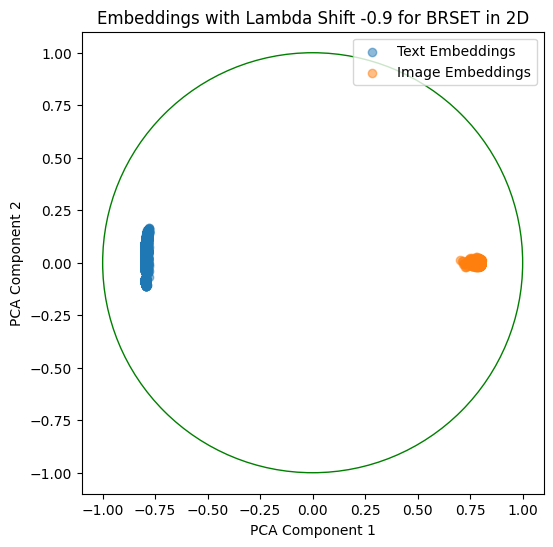

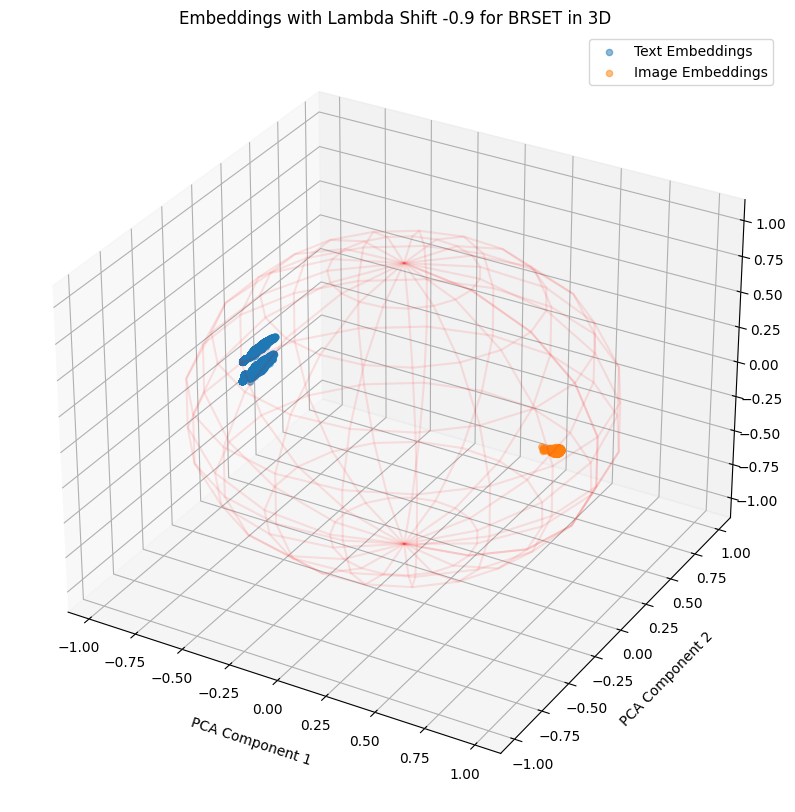

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 9.13 seconds
Total Training Time per Epoch: 913.01 seconds
Average Inference Time per Epoch: 1.19 seconds
Total Inference Time per Epoch: 119.10 seconds


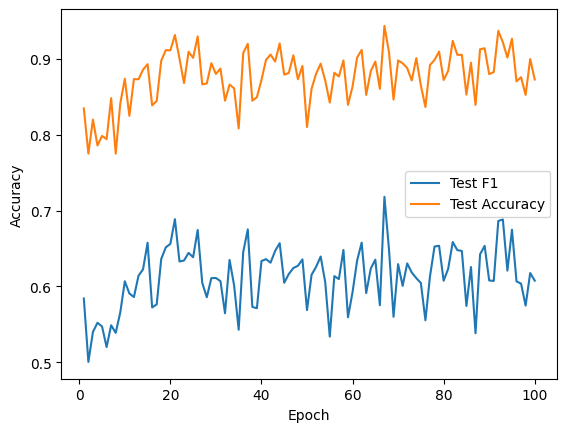

Best Accuracy: {'Acc': 0.9434542102028273, 'F1': 0.7180596228786348, 'Epoch': 67}
Best Macro-F1: {'Acc': 0.9434542102028273, 'F1': 0.7180596228786348, 'Epoch': 67}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 3.15 seconds
Total Training Time per Epoch: 314.53 seconds
Average Inference Time per Epoch: 0.60 seconds
Total Inference Time per Epoch: 59.60 seconds


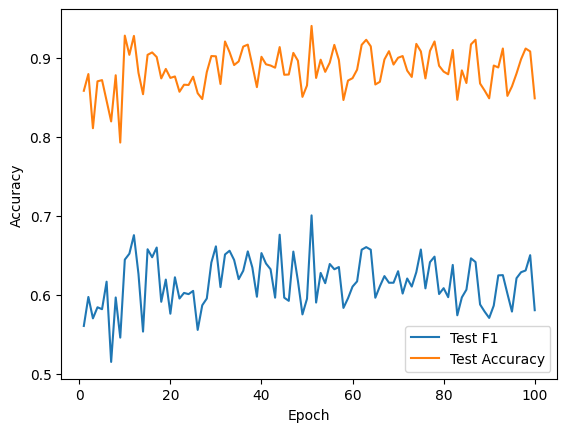

Best Accuracy: {'Acc': 0.9400737553779963, 'F1': 0.7004630417485291, 'Epoch': 51}
Best Macro-F1: {'Acc': 0.9400737553779963, 'F1': 0.7004630417485291, 'Epoch': 51}
##################################################  Shift -0.8  ##################################################


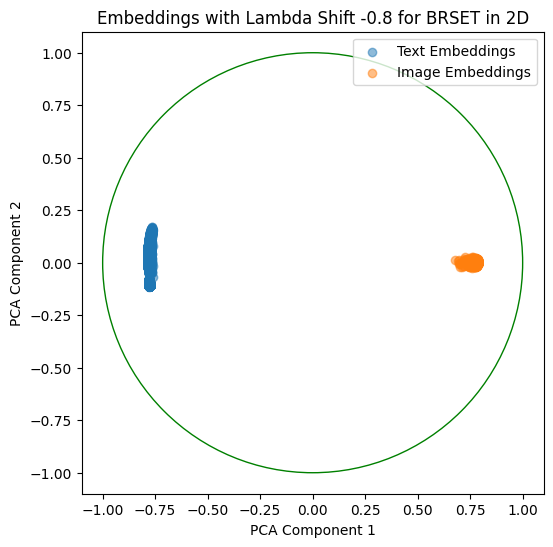

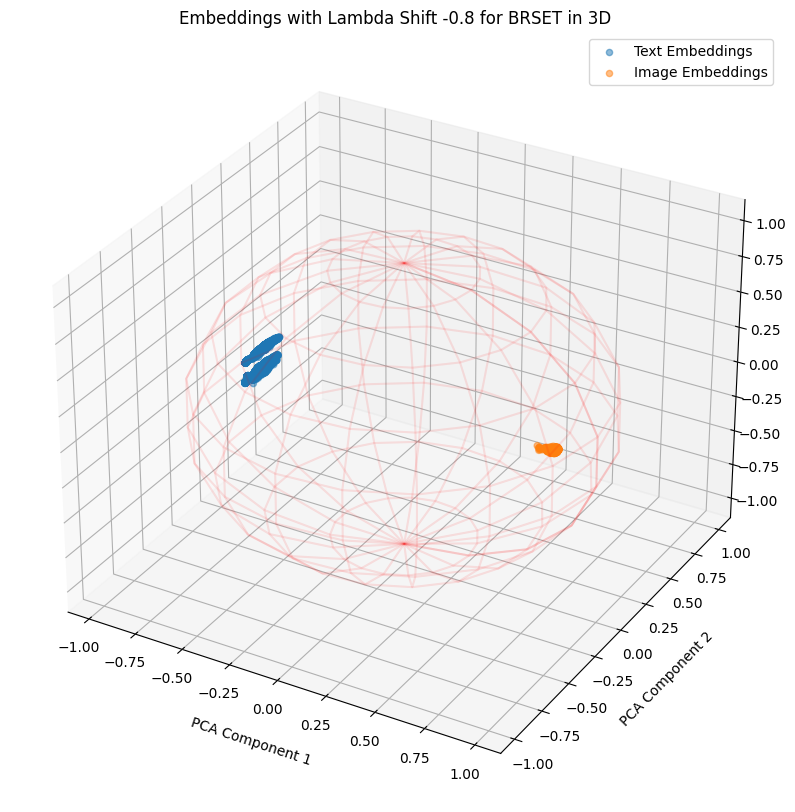

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 2.67 seconds
Total Training Time per Epoch: 267.21 seconds
Average Inference Time per Epoch: 0.58 seconds
Total Inference Time per Epoch: 58.05 seconds


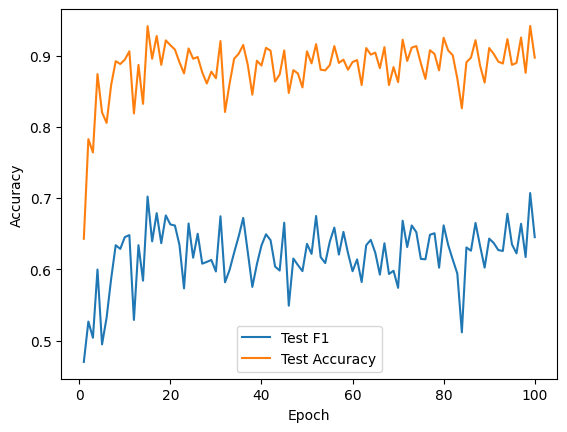

Best Accuracy: {'Acc': 0.9416103257529195, 'F1': 0.7069902447984334, 'Epoch': 99}
Best Macro-F1: {'Acc': 0.9416103257529195, 'F1': 0.7069902447984334, 'Epoch': 99}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.67 seconds
Total Training Time per Epoch: 267.20 seconds
Average Inference Time per Epoch: 0.52 seconds
Total Inference Time per Epoch: 52.32 seconds


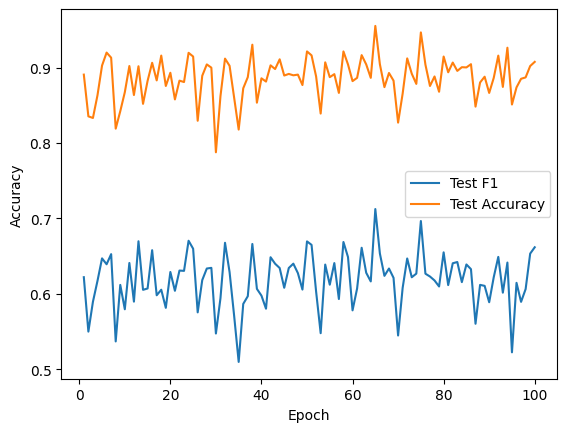

Best Accuracy: {'Acc': 0.9551321450522434, 'F1': 0.7124231758192511, 'Epoch': 65}
Best Macro-F1: {'Acc': 0.9551321450522434, 'F1': 0.7124231758192511, 'Epoch': 65}
##################################################  Shift -0.7  ##################################################


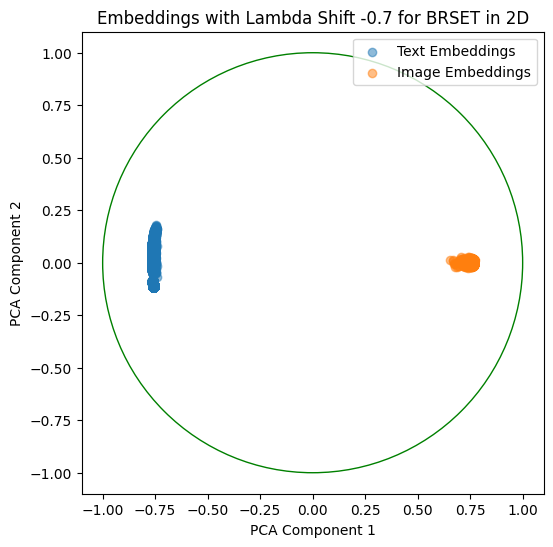

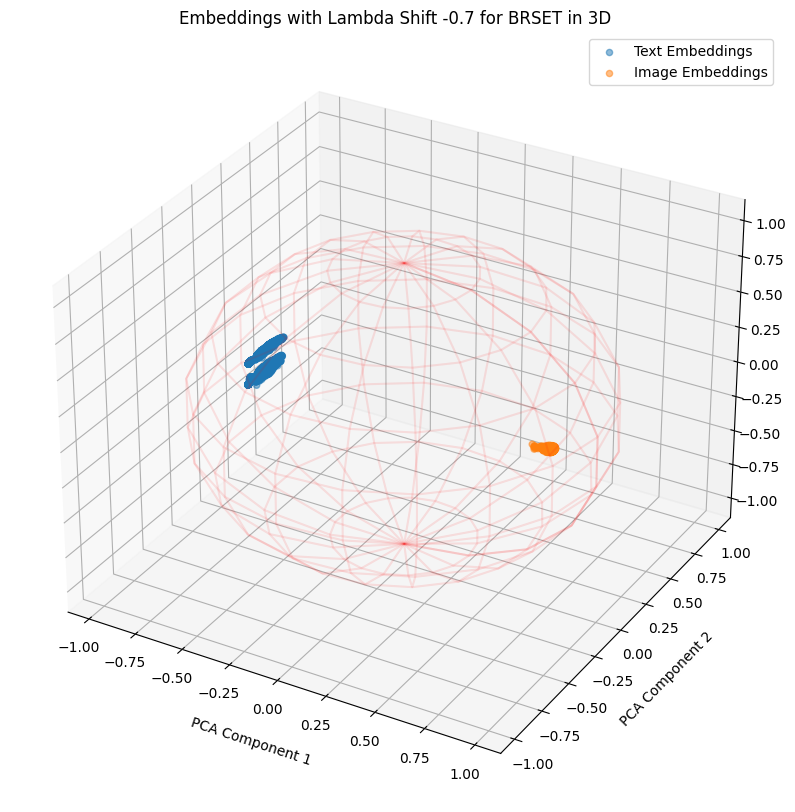

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 2.21 seconds
Total Training Time per Epoch: 220.55 seconds
Average Inference Time per Epoch: 0.51 seconds
Total Inference Time per Epoch: 50.87 seconds


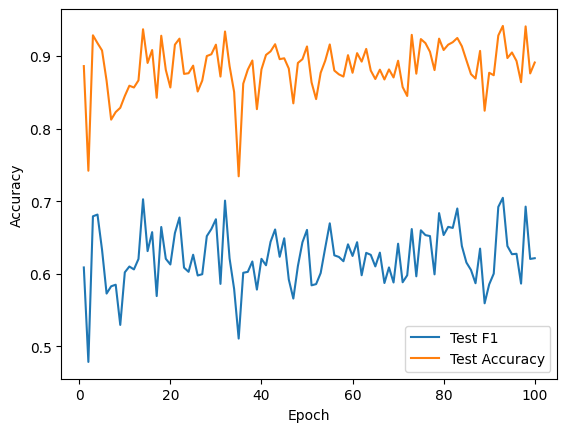

Best Accuracy: {'Acc': 0.9413030116779348, 'F1': 0.7045626787086503, 'Epoch': 93}
Best Macro-F1: {'Acc': 0.9413030116779348, 'F1': 0.7045626787086503, 'Epoch': 93}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 7.51 seconds
Total Training Time per Epoch: 751.00 seconds
Average Inference Time per Epoch: 1.02 seconds
Total Inference Time per Epoch: 102.29 seconds


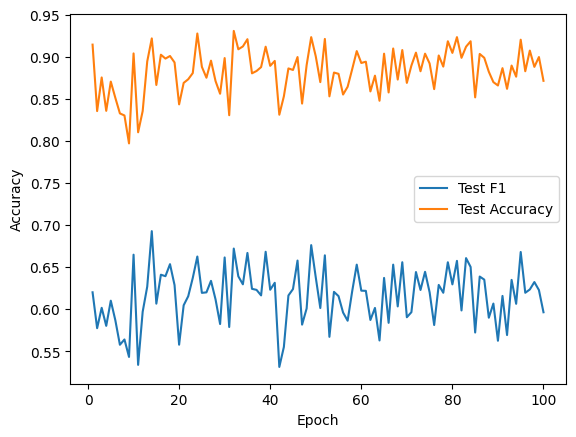

Best Accuracy: {'Acc': 0.9308543331284573, 'F1': 0.6721848890466529, 'Epoch': 32}
Best Macro-F1: {'Acc': 0.9219422249539029, 'F1': 0.692893739118133, 'Epoch': 14}
##################################################  Shift -0.6  ##################################################


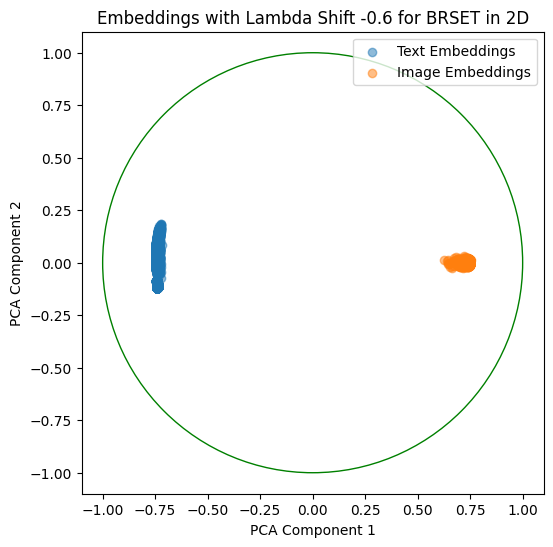

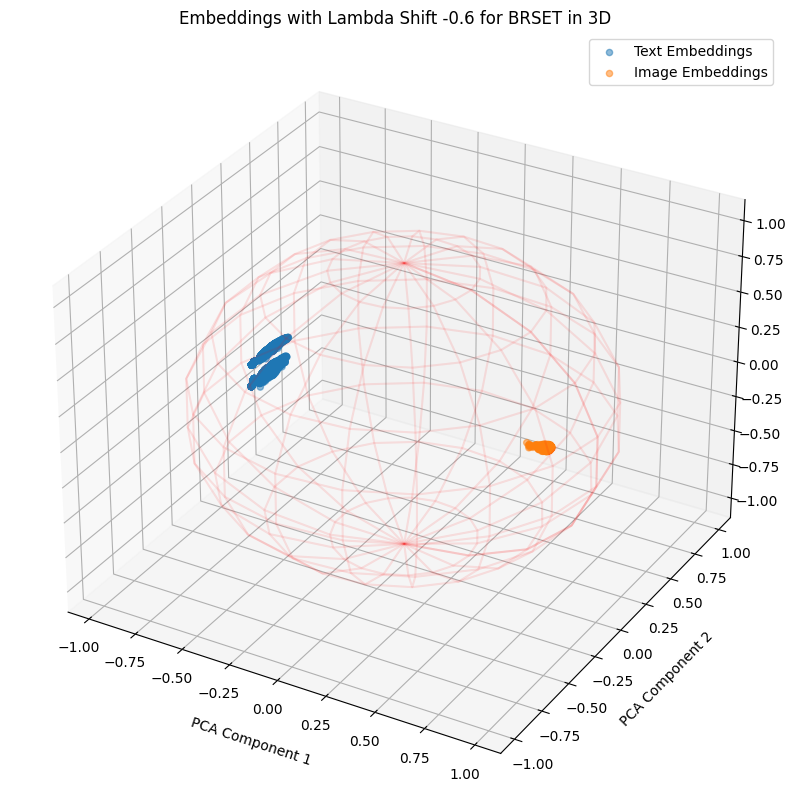

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 2.74 seconds
Total Training Time per Epoch: 273.80 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 59.02 seconds


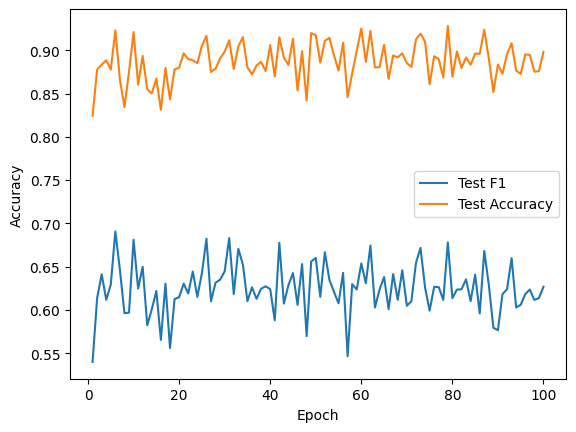

Best Accuracy: {'Acc': 0.9280885064535955, 'F1': 0.6778497068202544, 'Epoch': 79}
Best Macro-F1: {'Acc': 0.9228641671788568, 'F1': 0.6905573563293267, 'Epoch': 6}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 9.61 seconds
Total Training Time per Epoch: 960.81 seconds
Average Inference Time per Epoch: 1.28 seconds
Total Inference Time per Epoch: 128.44 seconds


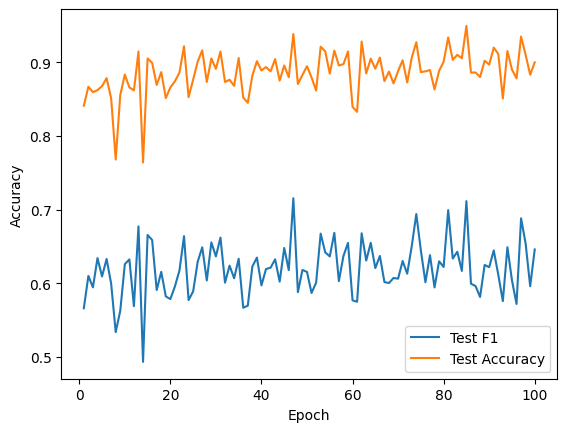

Best Accuracy: {'Acc': 0.9496004917025199, 'F1': 0.7114656186023048, 'Epoch': 85}
Best Macro-F1: {'Acc': 0.9385371850030731, 'F1': 0.7153964720553376, 'Epoch': 47}
##################################################  Shift -0.5  ##################################################


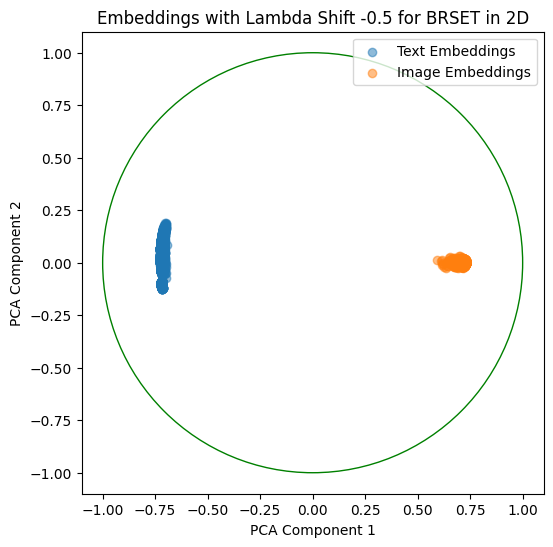

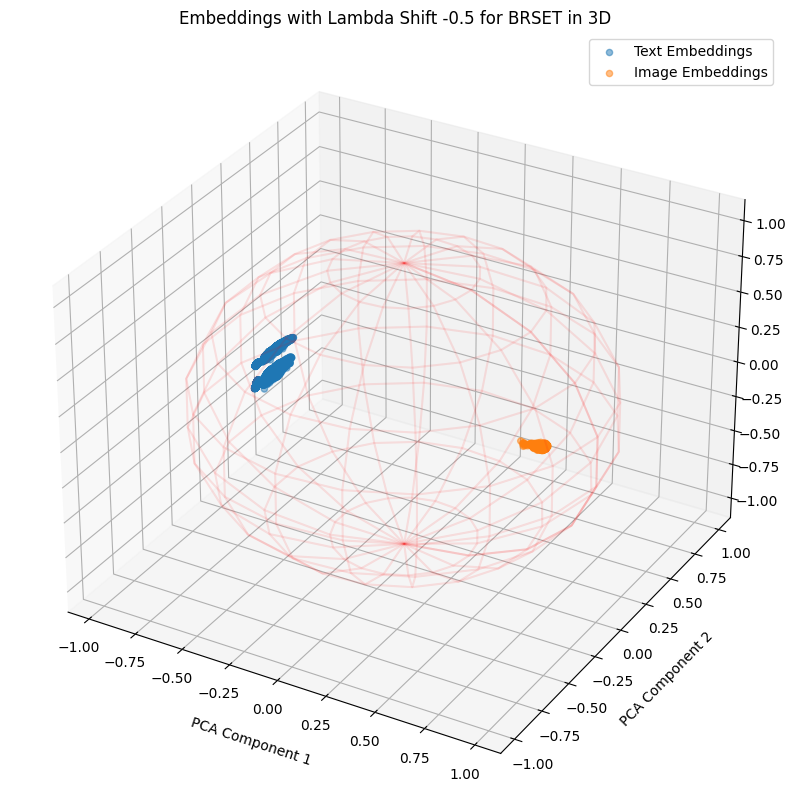

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 2.74 seconds
Total Training Time per Epoch: 273.74 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 58.90 seconds


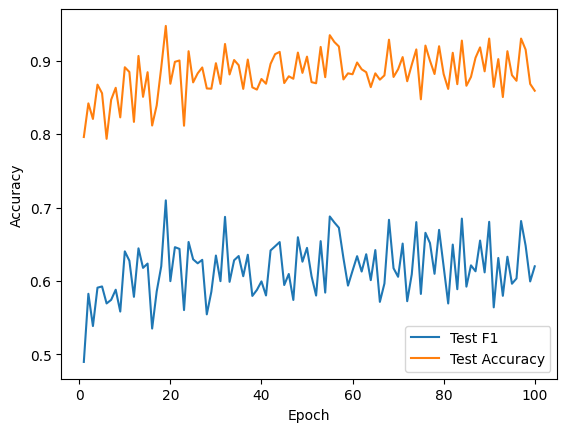

Best Accuracy: {'Acc': 0.9471419791026429, 'F1': 0.7097316471253493, 'Epoch': 19}
Best Macro-F1: {'Acc': 0.9471419791026429, 'F1': 0.7097316471253493, 'Epoch': 19}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.36 seconds
Total Training Time per Epoch: 236.21 seconds
Average Inference Time per Epoch: 0.49 seconds
Total Inference Time per Epoch: 48.96 seconds


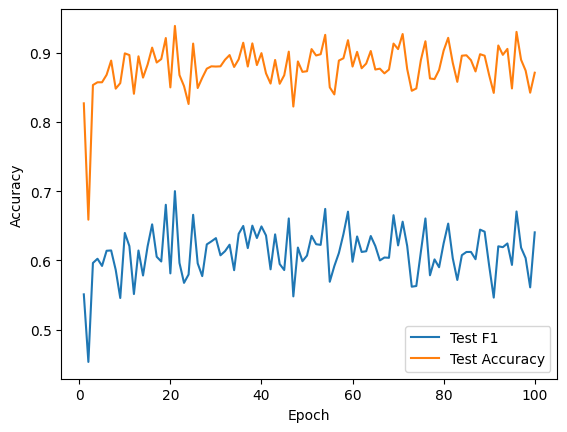

Best Accuracy: {'Acc': 0.9388444990780578, 'F1': 0.7001404464418058, 'Epoch': 21}
Best Macro-F1: {'Acc': 0.9388444990780578, 'F1': 0.7001404464418058, 'Epoch': 21}
##################################################  Shift -0.4  ##################################################


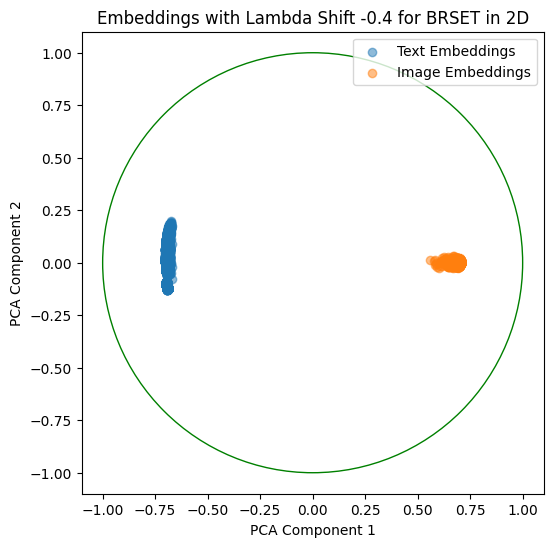

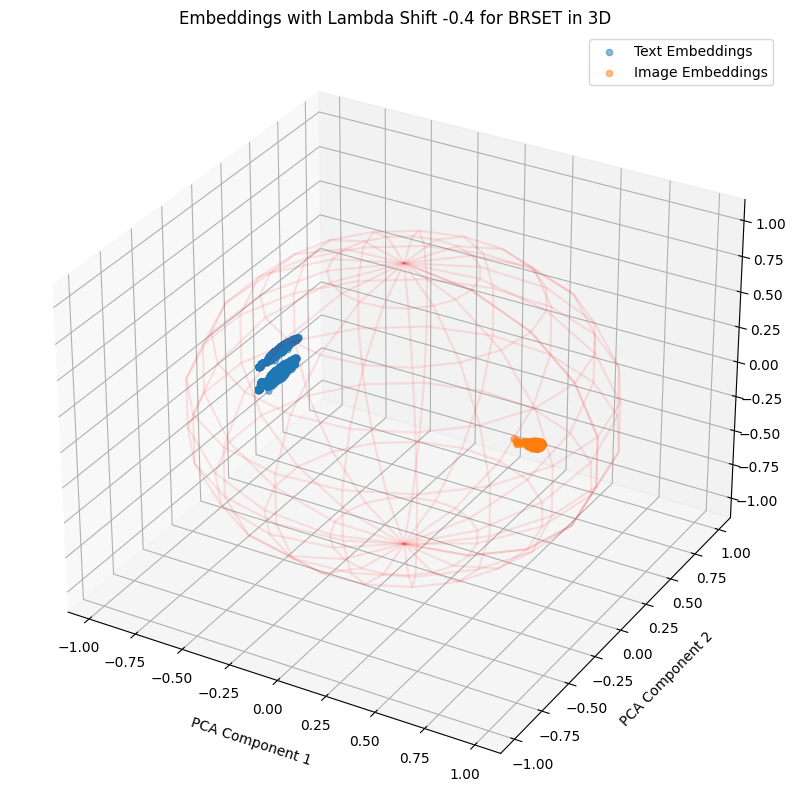

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.81 seconds
Total Training Time per Epoch: 181.46 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 42.57 seconds


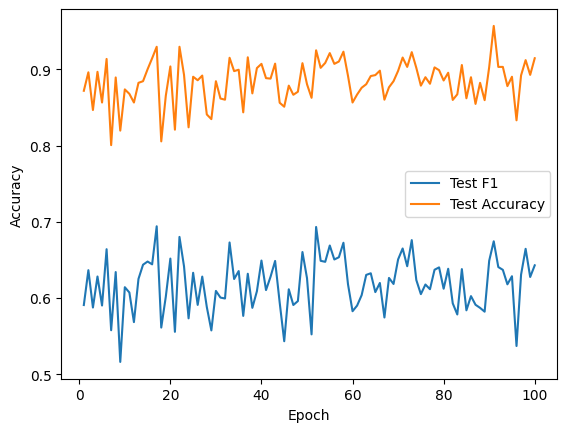

Best Accuracy: {'Acc': 0.9569760295021512, 'F1': 0.6743967324570633, 'Epoch': 91}
Best Macro-F1: {'Acc': 0.9296250768285187, 'F1': 0.6940626153464856, 'Epoch': 17}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.04 seconds
Total Training Time per Epoch: 203.85 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 42.87 seconds


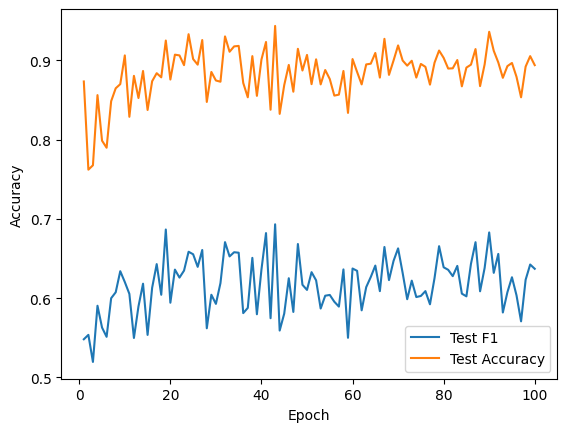

Best Accuracy: {'Acc': 0.9434542102028273, 'F1': 0.6932199053712997, 'Epoch': 43}
Best Macro-F1: {'Acc': 0.9434542102028273, 'F1': 0.6932199053712997, 'Epoch': 43}
##################################################  Shift -0.3  ##################################################


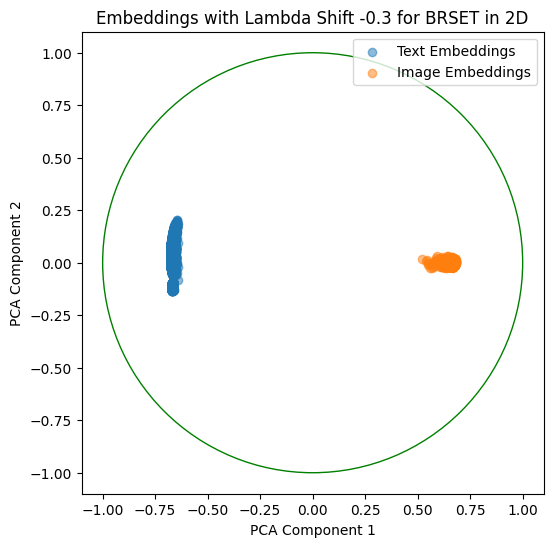

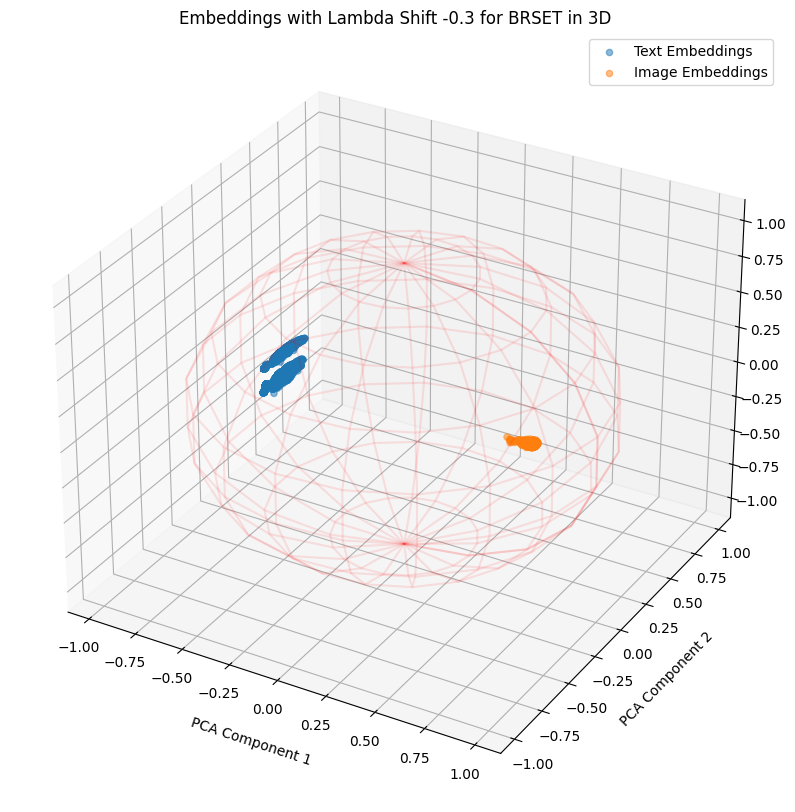

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.80 seconds
Total Training Time per Epoch: 179.62 seconds
Average Inference Time per Epoch: 0.41 seconds
Total Inference Time per Epoch: 41.50 seconds


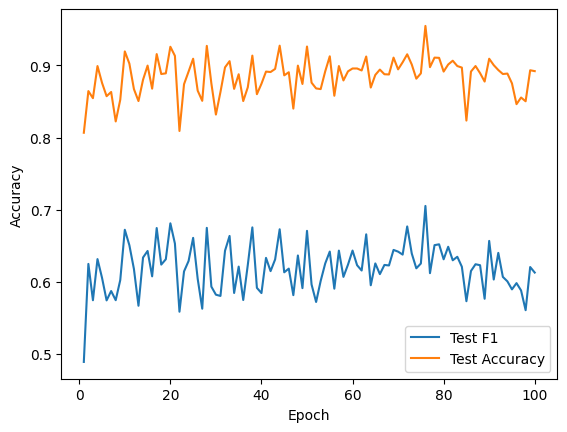

Best Accuracy: {'Acc': 0.9548248309772588, 'F1': 0.7052300386615645, 'Epoch': 76}
Best Macro-F1: {'Acc': 0.9548248309772588, 'F1': 0.7052300386615645, 'Epoch': 76}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.00 seconds
Total Training Time per Epoch: 200.16 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 43.33 seconds


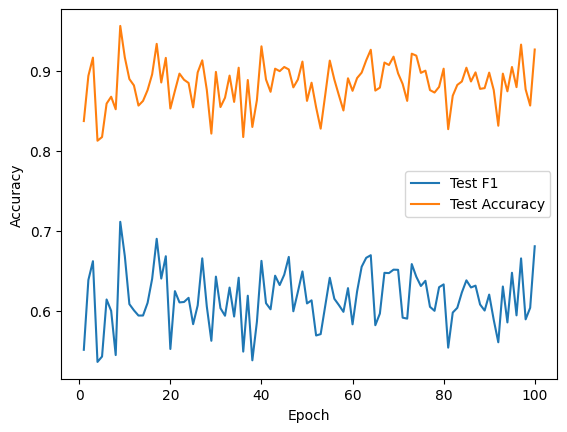

Best Accuracy: {'Acc': 0.956361401352182, 'F1': 0.7114861949829295, 'Epoch': 9}
Best Macro-F1: {'Acc': 0.956361401352182, 'F1': 0.7114861949829295, 'Epoch': 9}
##################################################  Shift -0.2  ##################################################


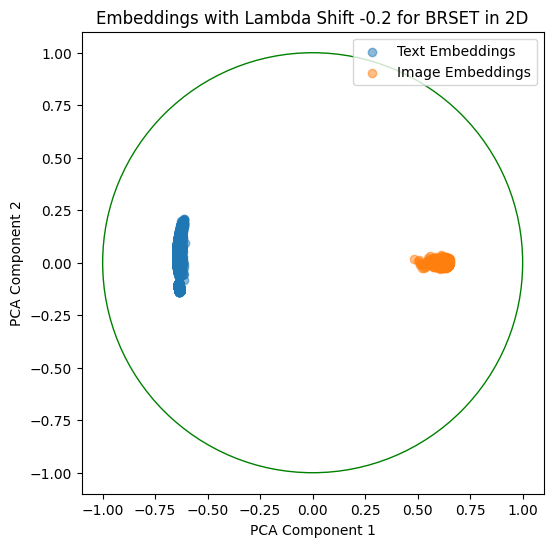

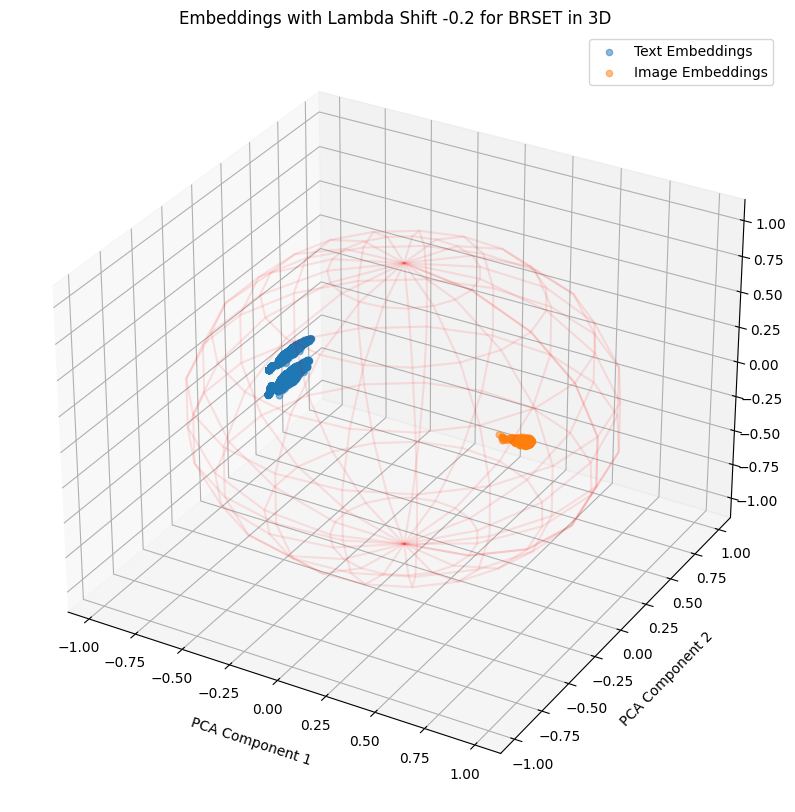

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.80 seconds
Total Training Time per Epoch: 180.49 seconds
Average Inference Time per Epoch: 0.42 seconds
Total Inference Time per Epoch: 41.58 seconds


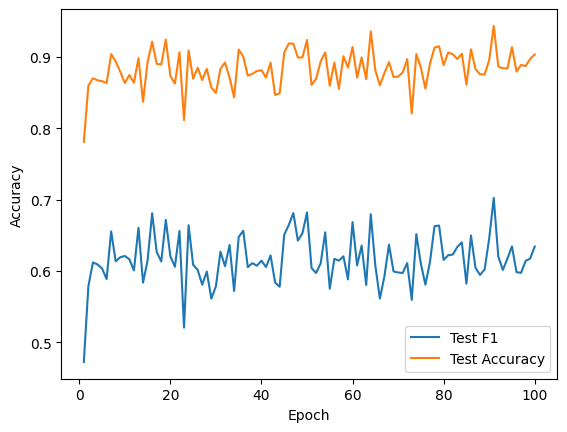

Best Accuracy: {'Acc': 0.9434542102028273, 'F1': 0.7022978824316519, 'Epoch': 91}
Best Macro-F1: {'Acc': 0.9434542102028273, 'F1': 0.7022978824316519, 'Epoch': 91}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.06 seconds
Total Training Time per Epoch: 205.52 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 42.79 seconds


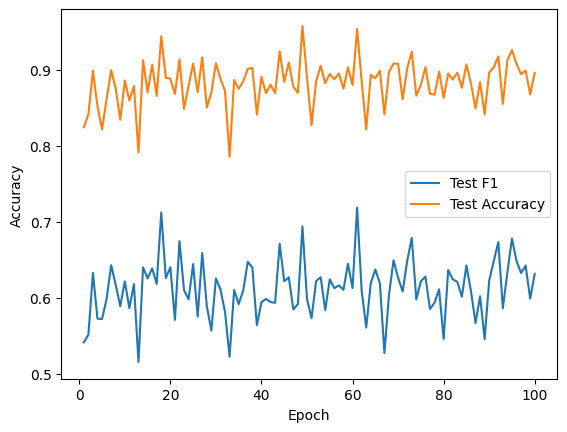

Best Accuracy: {'Acc': 0.9582052858020897, 'F1': 0.6941339813473509, 'Epoch': 49}
Best Macro-F1: {'Acc': 0.9542102028272895, 'F1': 0.7188705023267721, 'Epoch': 61}
##################################################  Shift -0.1  ##################################################


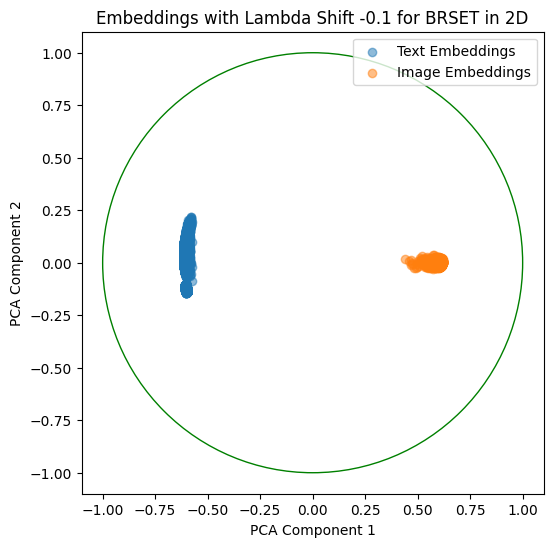

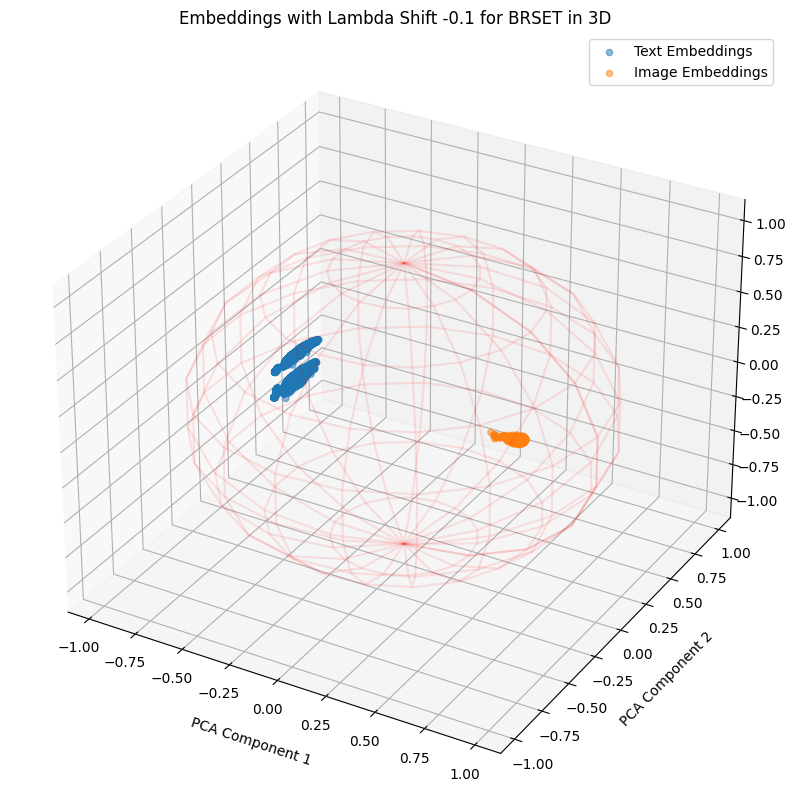

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.76 seconds
Total Training Time per Epoch: 175.73 seconds
Average Inference Time per Epoch: 0.42 seconds
Total Inference Time per Epoch: 42.20 seconds


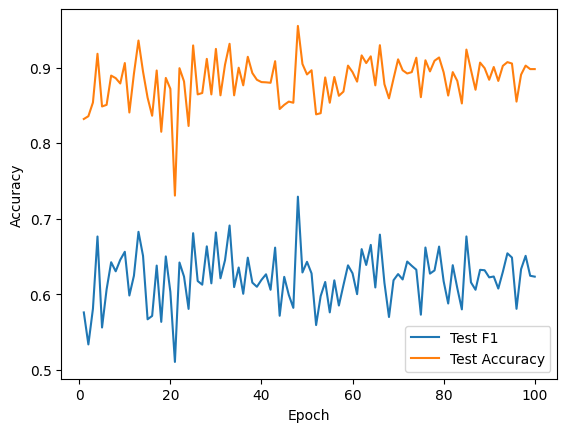

Best Accuracy: {'Acc': 0.9551321450522434, 'F1': 0.7290710952790566, 'Epoch': 48}
Best Macro-F1: {'Acc': 0.9551321450522434, 'F1': 0.7290710952790566, 'Epoch': 48}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.01 seconds
Total Training Time per Epoch: 200.87 seconds
Average Inference Time per Epoch: 0.42 seconds
Total Inference Time per Epoch: 42.20 seconds


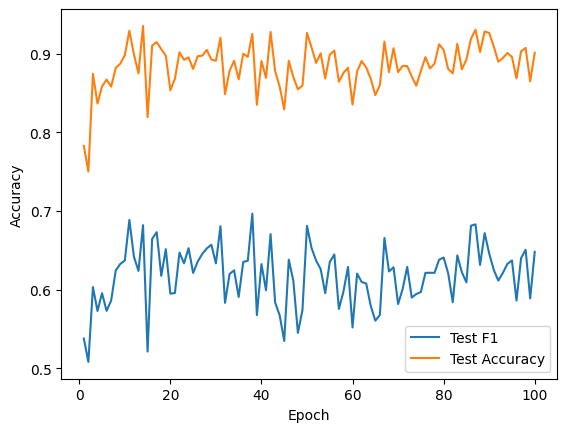

Best Accuracy: {'Acc': 0.9351567301782422, 'F1': 0.6820417225347205, 'Epoch': 14}
Best Macro-F1: {'Acc': 0.9250153657037492, 'F1': 0.6967023817160367, 'Epoch': 38}
##################################################  Shift 0  ##################################################


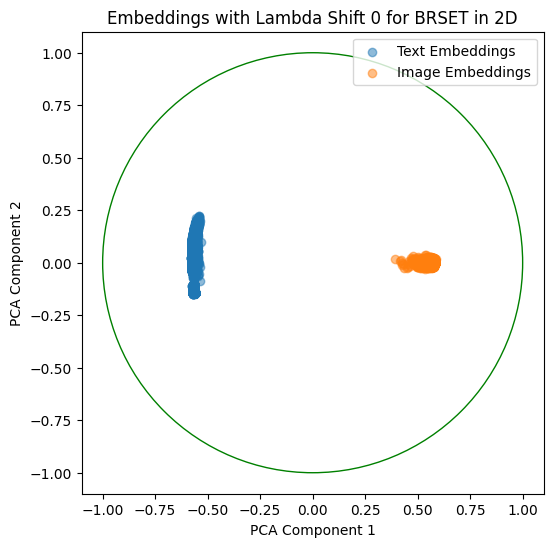

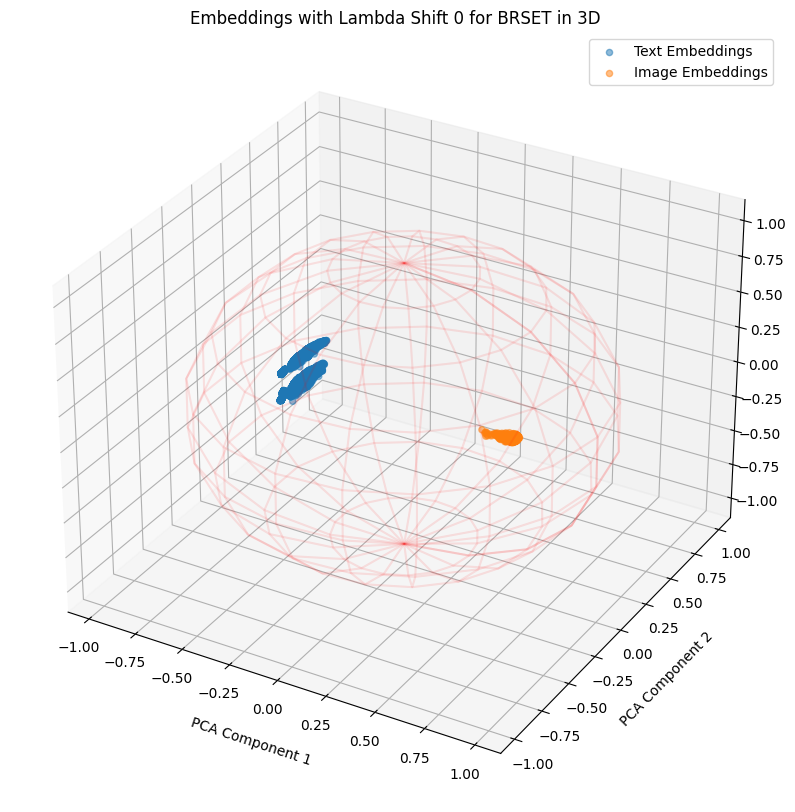

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.81 seconds
Total Training Time per Epoch: 180.70 seconds
Average Inference Time per Epoch: 0.42 seconds
Total Inference Time per Epoch: 41.97 seconds


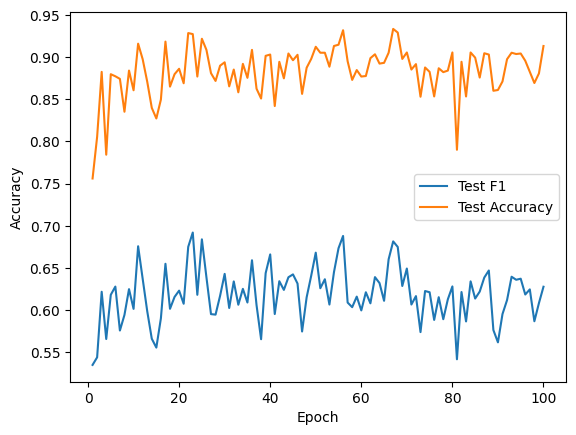

Best Accuracy: {'Acc': 0.933620159803319, 'F1': 0.68130383951536, 'Epoch': 67}
Best Macro-F1: {'Acc': 0.9274738783036263, 'F1': 0.691829553525213, 'Epoch': 23}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.06 seconds
Total Training Time per Epoch: 205.53 seconds
Average Inference Time per Epoch: 0.44 seconds
Total Inference Time per Epoch: 43.72 seconds


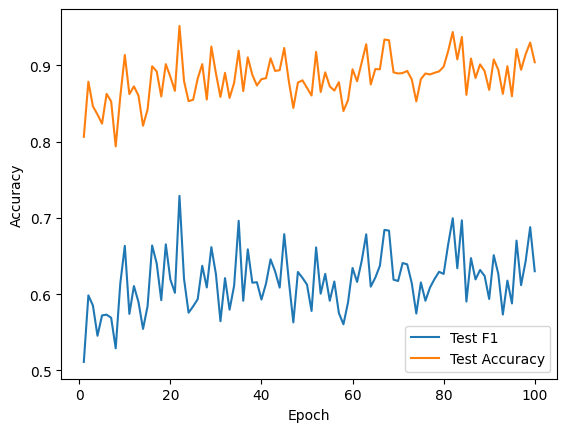

Best Accuracy: {'Acc': 0.9517516902274125, 'F1': 0.7289450886613819, 'Epoch': 22}
Best Macro-F1: {'Acc': 0.9517516902274125, 'F1': 0.7289450886613819, 'Epoch': 22}
##################################################  Shift 0.1  ##################################################


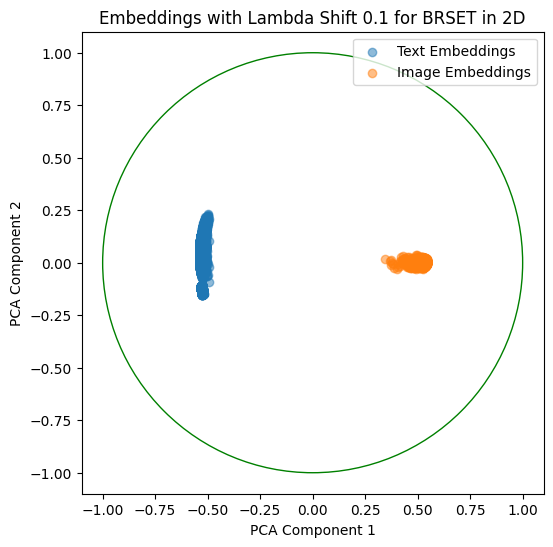

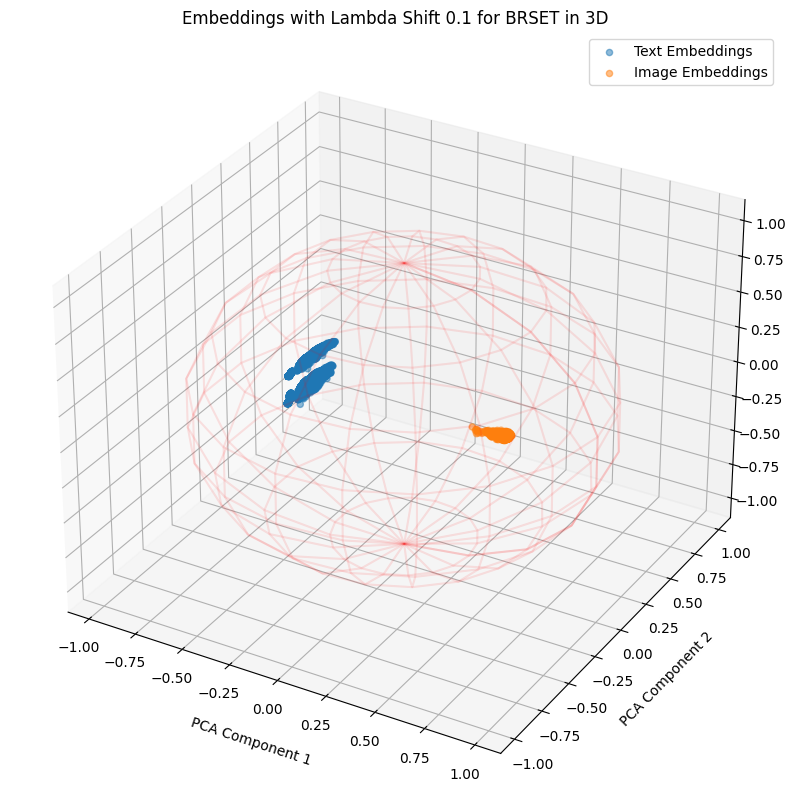

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.79 seconds
Total Training Time per Epoch: 178.51 seconds
Average Inference Time per Epoch: 0.41 seconds
Total Inference Time per Epoch: 41.18 seconds


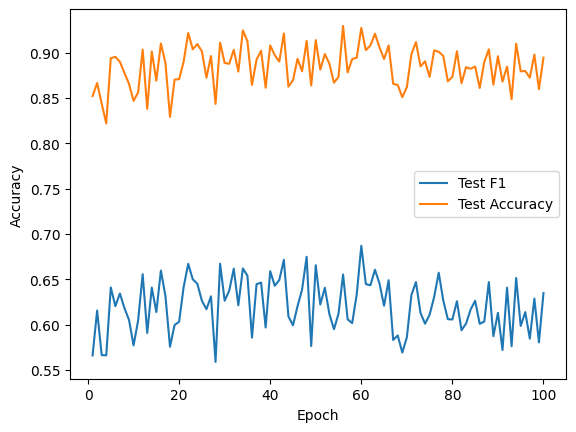

Best Accuracy: {'Acc': 0.9296250768285187, 'F1': 0.655263049788977, 'Epoch': 56}
Best Macro-F1: {'Acc': 0.9274738783036263, 'F1': 0.6869627826276375, 'Epoch': 60}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.01 seconds
Total Training Time per Epoch: 200.94 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 42.60 seconds


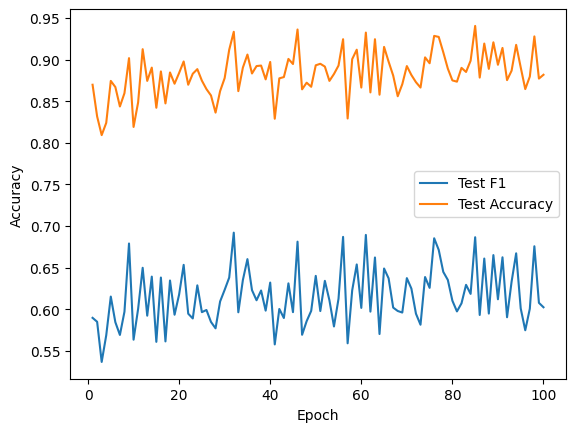

Best Accuracy: {'Acc': 0.9403810694529809, 'F1': 0.6864341762210193, 'Epoch': 85}
Best Macro-F1: {'Acc': 0.9333128457283344, 'F1': 0.6919431085902364, 'Epoch': 32}
##################################################  Shift 0.2  ##################################################


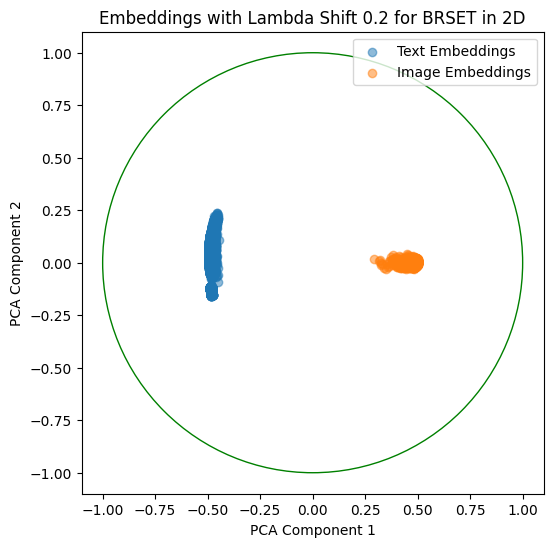

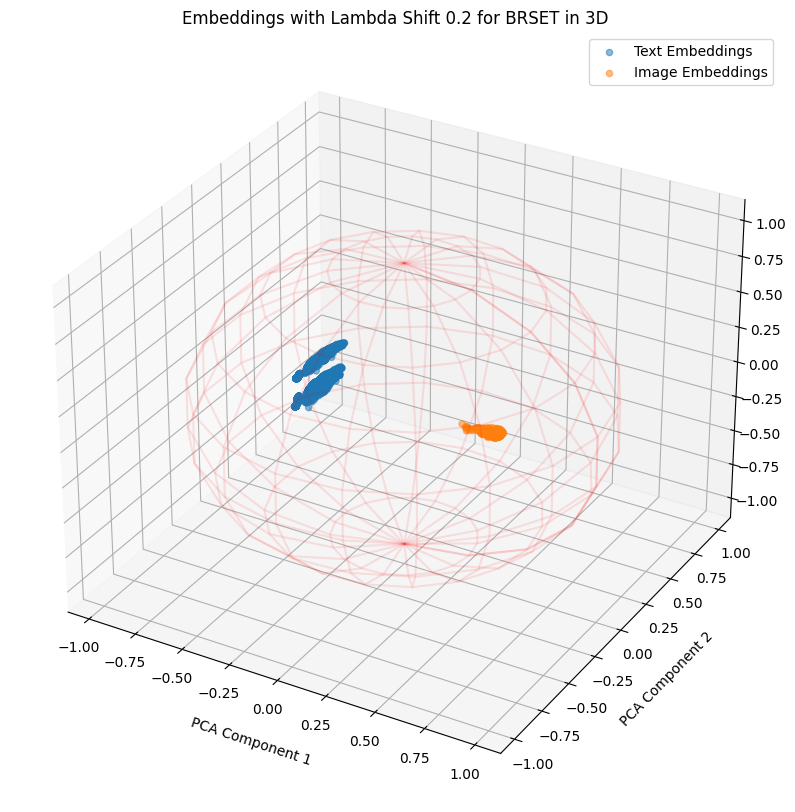

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.82 seconds
Total Training Time per Epoch: 182.31 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 42.62 seconds


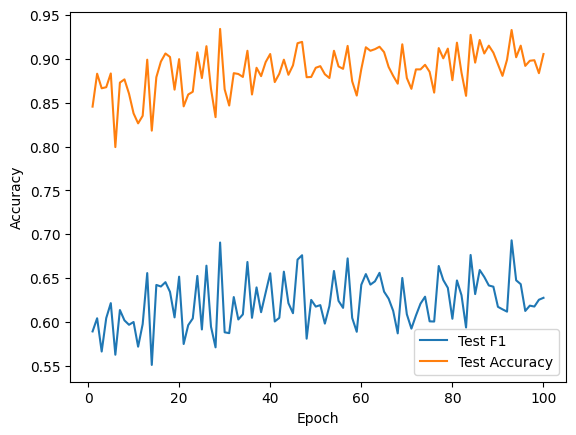

Best Accuracy: {'Acc': 0.9339274738783037, 'F1': 0.6906443050043785, 'Epoch': 29}
Best Macro-F1: {'Acc': 0.9326982175783651, 'F1': 0.6931469043897401, 'Epoch': 93}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.05 seconds
Total Training Time per Epoch: 204.55 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 42.52 seconds


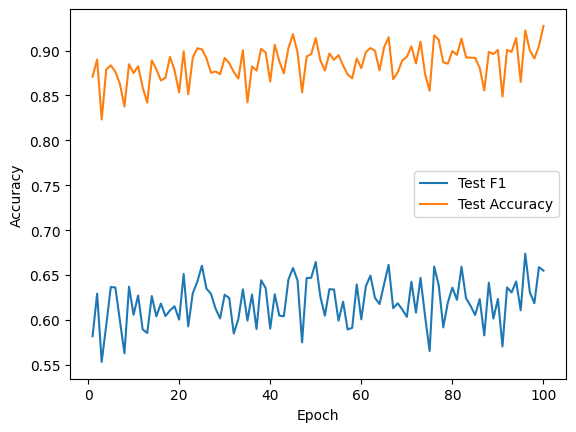

Best Accuracy: {'Acc': 0.9274738783036263, 'F1': 0.6549233678206968, 'Epoch': 100}
Best Macro-F1: {'Acc': 0.9225568531038721, 'F1': 0.6738150236738605, 'Epoch': 96}
##################################################  Shift 0.3  ##################################################


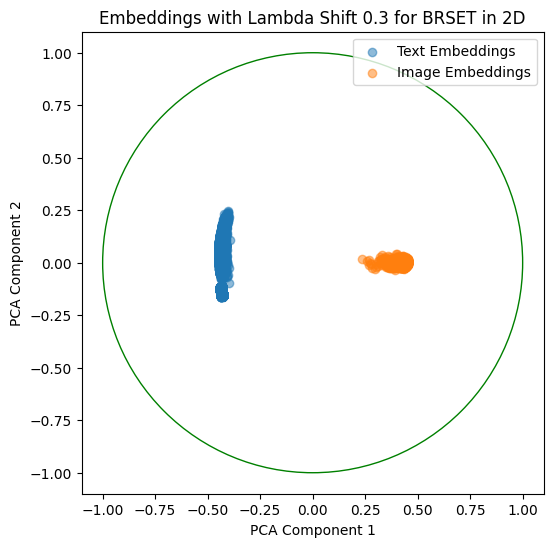

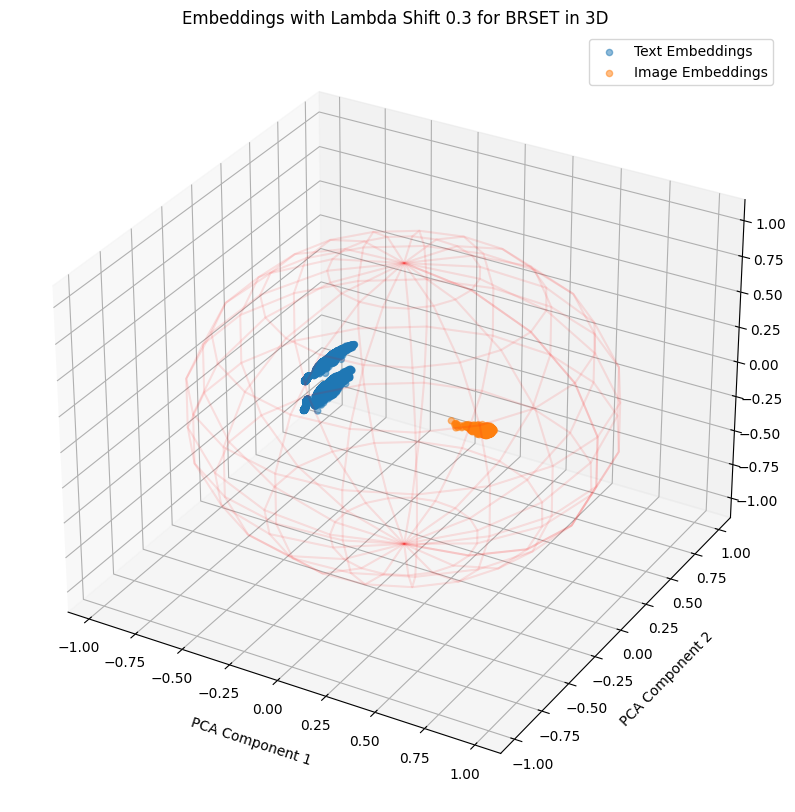

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.80 seconds
Total Training Time per Epoch: 180.16 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 42.61 seconds


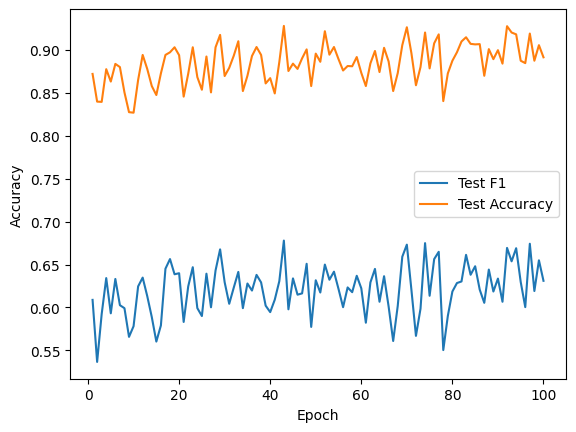

Best Accuracy: {'Acc': 0.9280885064535955, 'F1': 0.6779657612768896, 'Epoch': 43}
Best Macro-F1: {'Acc': 0.9280885064535955, 'F1': 0.6779657612768896, 'Epoch': 43}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.09 seconds
Total Training Time per Epoch: 208.56 seconds
Average Inference Time per Epoch: 0.44 seconds
Total Inference Time per Epoch: 44.39 seconds


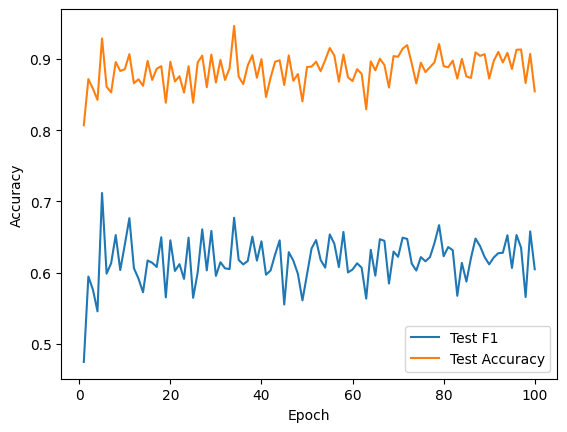

Best Accuracy: {'Acc': 0.9465273509526736, 'F1': 0.6769632410825398, 'Epoch': 34}
Best Macro-F1: {'Acc': 0.9290104486785494, 'F1': 0.7117433192815166, 'Epoch': 5}
##################################################  Shift 0.4  ##################################################


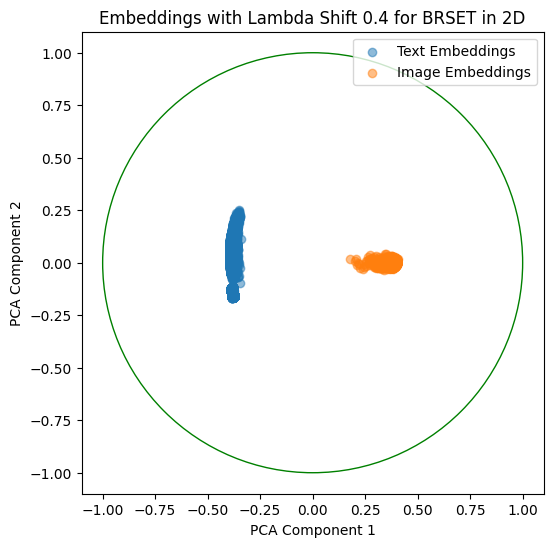

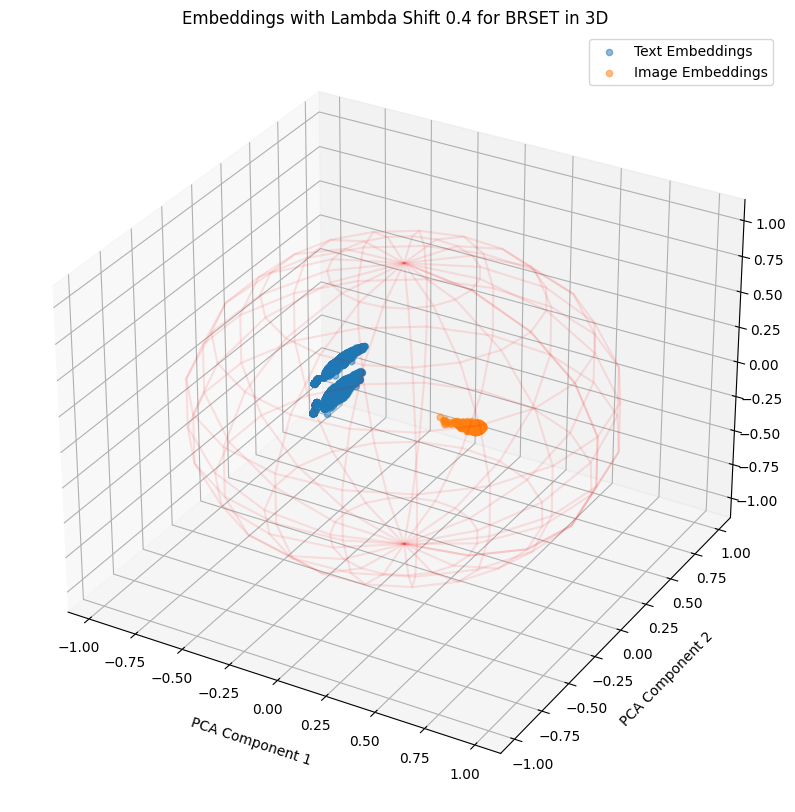

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.88 seconds
Total Training Time per Epoch: 188.10 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 42.69 seconds


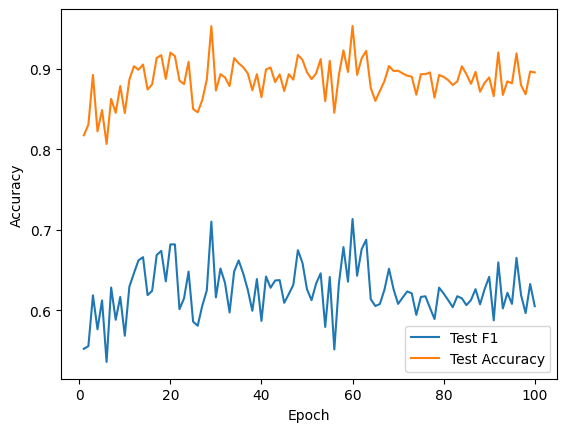

Best Accuracy: {'Acc': 0.9532882606023356, 'F1': 0.7135094904384996, 'Epoch': 60}
Best Macro-F1: {'Acc': 0.9532882606023356, 'F1': 0.7135094904384996, 'Epoch': 60}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.08 seconds
Total Training Time per Epoch: 208.42 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 42.67 seconds


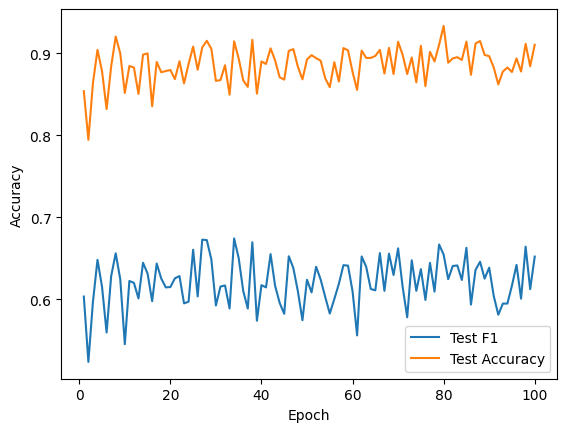

Best Accuracy: {'Acc': 0.9333128457283344, 'F1': 0.65445108217594, 'Epoch': 80}
Best Macro-F1: {'Acc': 0.9145666871542717, 'F1': 0.6741096870327498, 'Epoch': 34}
##################################################  Shift 0.5  ##################################################


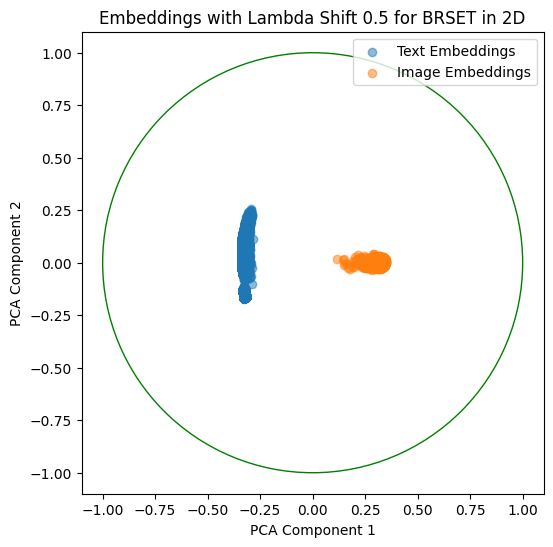

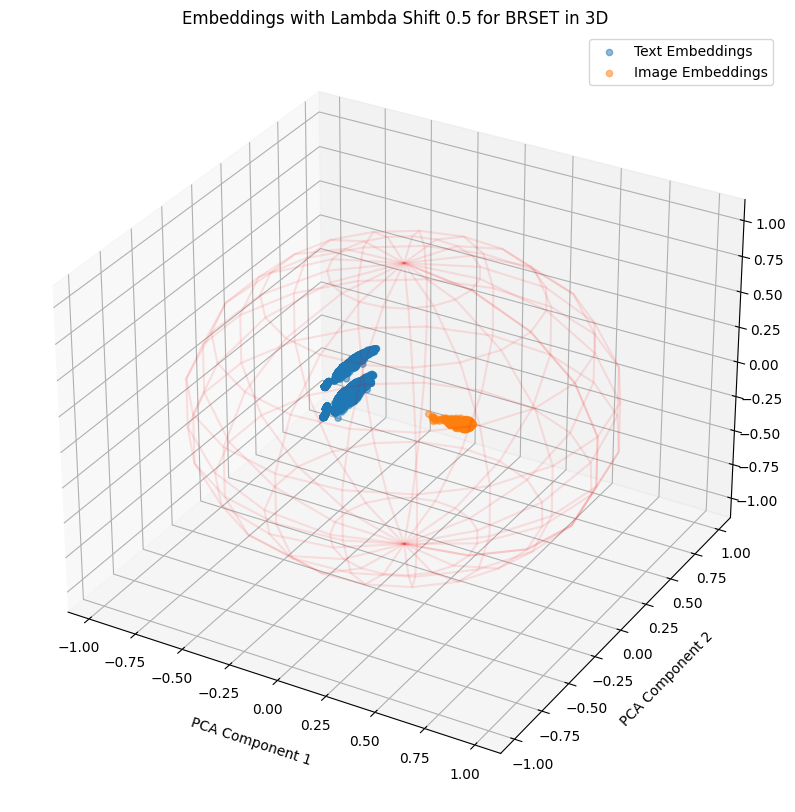

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.80 seconds
Total Training Time per Epoch: 180.24 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 43.15 seconds


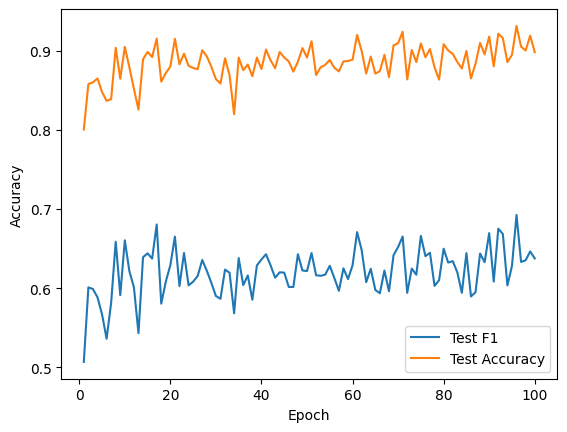

Best Accuracy: {'Acc': 0.9314689612784266, 'F1': 0.6925543151284291, 'Epoch': 96}
Best Macro-F1: {'Acc': 0.9314689612784266, 'F1': 0.6925543151284291, 'Epoch': 96}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.03 seconds
Total Training Time per Epoch: 202.60 seconds
Average Inference Time per Epoch: 0.44 seconds
Total Inference Time per Epoch: 43.94 seconds


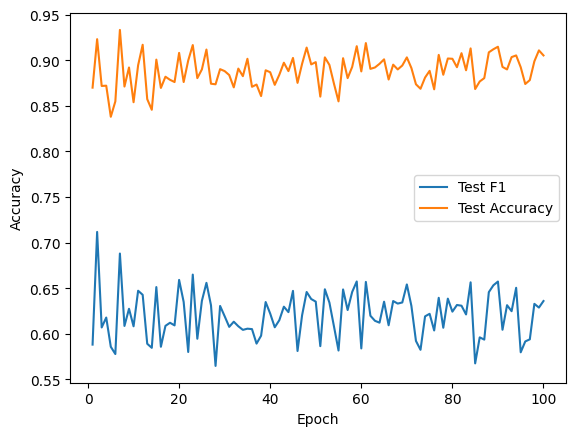

Best Accuracy: {'Acc': 0.9333128457283344, 'F1': 0.6880863333863635, 'Epoch': 7}
Best Macro-F1: {'Acc': 0.9231714812538414, 'F1': 0.7117749153772784, 'Epoch': 2}
##################################################  Shift 0.6  ##################################################


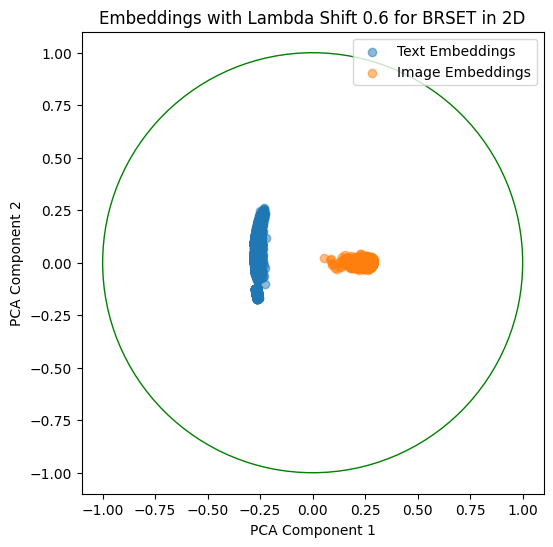

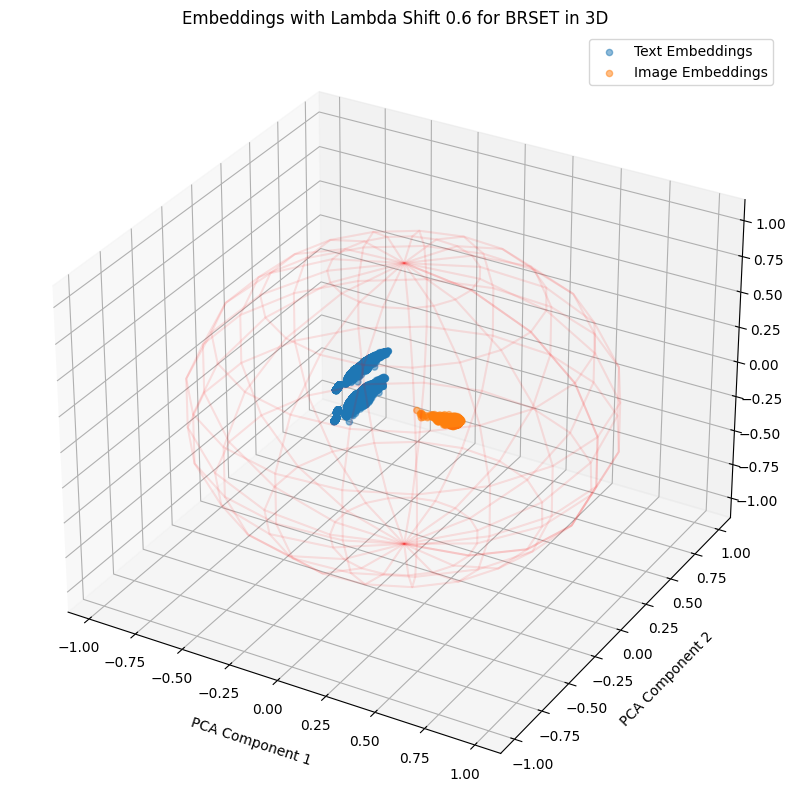

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.78 seconds
Total Training Time per Epoch: 177.63 seconds
Average Inference Time per Epoch: 0.42 seconds
Total Inference Time per Epoch: 42.16 seconds


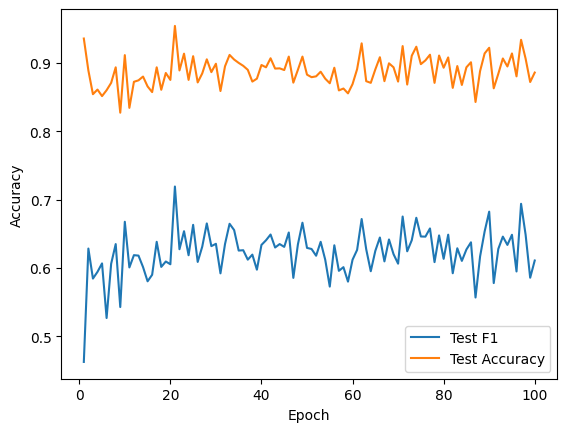

Best Accuracy: {'Acc': 0.9542102028272895, 'F1': 0.7192878002416627, 'Epoch': 21}
Best Macro-F1: {'Acc': 0.9542102028272895, 'F1': 0.7192878002416627, 'Epoch': 21}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.01 seconds
Total Training Time per Epoch: 201.41 seconds
Average Inference Time per Epoch: 0.44 seconds
Total Inference Time per Epoch: 43.58 seconds


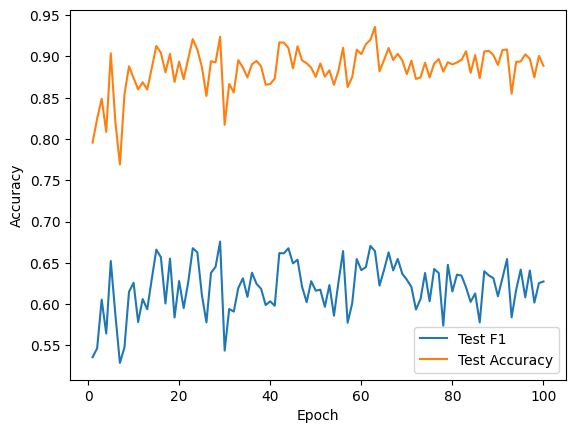

Best Accuracy: {'Acc': 0.9357713583282115, 'F1': 0.6642238402250882, 'Epoch': 63}
Best Macro-F1: {'Acc': 0.9237861094038107, 'F1': 0.6757462885711353, 'Epoch': 29}
##################################################  Shift 0.7  ##################################################


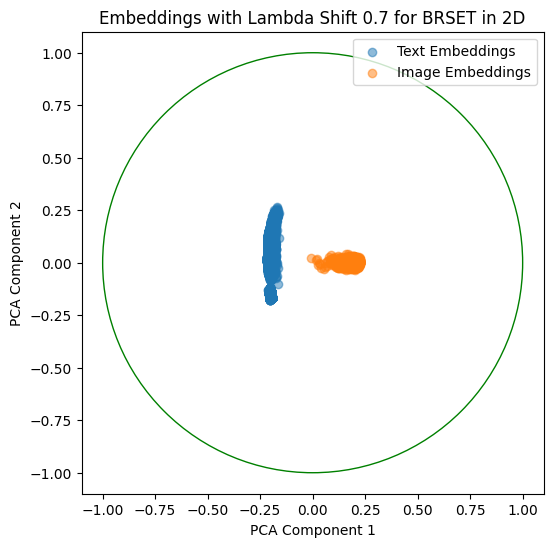

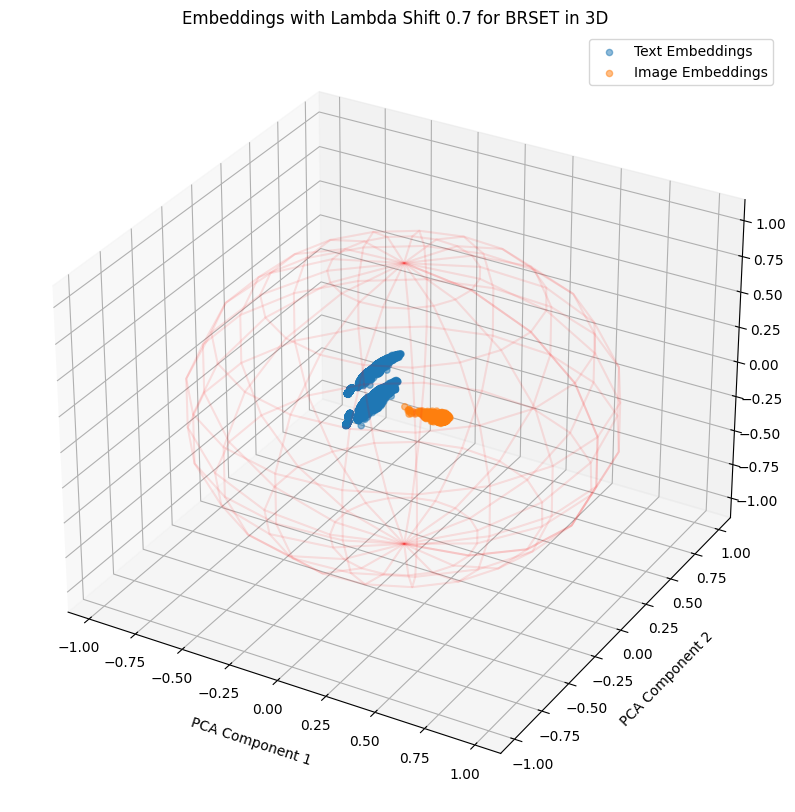

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.78 seconds
Total Training Time per Epoch: 178.02 seconds
Average Inference Time per Epoch: 0.42 seconds
Total Inference Time per Epoch: 41.77 seconds


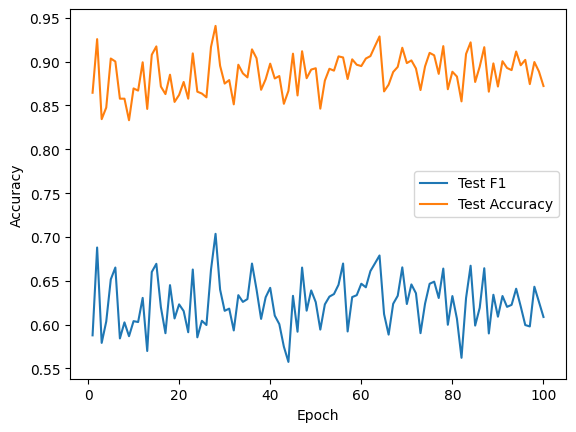

Best Accuracy: {'Acc': 0.9406883835279656, 'F1': 0.7035830205541774, 'Epoch': 28}
Best Macro-F1: {'Acc': 0.9406883835279656, 'F1': 0.7035830205541774, 'Epoch': 28}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.01 seconds
Total Training Time per Epoch: 200.89 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 43.07 seconds


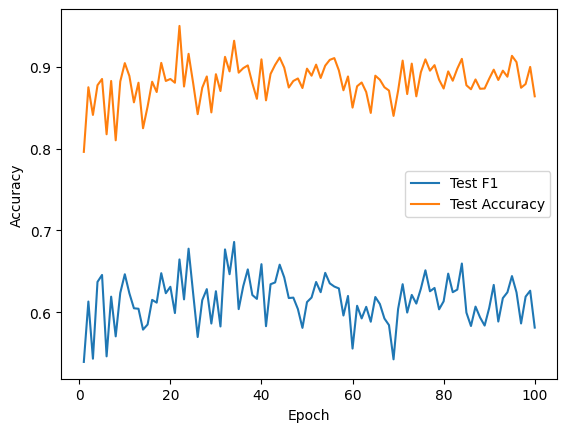

Best Accuracy: {'Acc': 0.9499078057775046, 'F1': 0.6644324705505474, 'Epoch': 22}
Best Macro-F1: {'Acc': 0.9317762753534112, 'F1': 0.6858139693024693, 'Epoch': 34}
##################################################  Shift 0.8  ##################################################


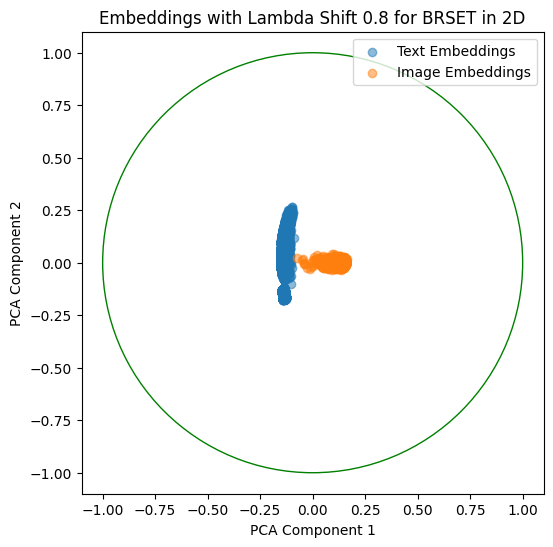

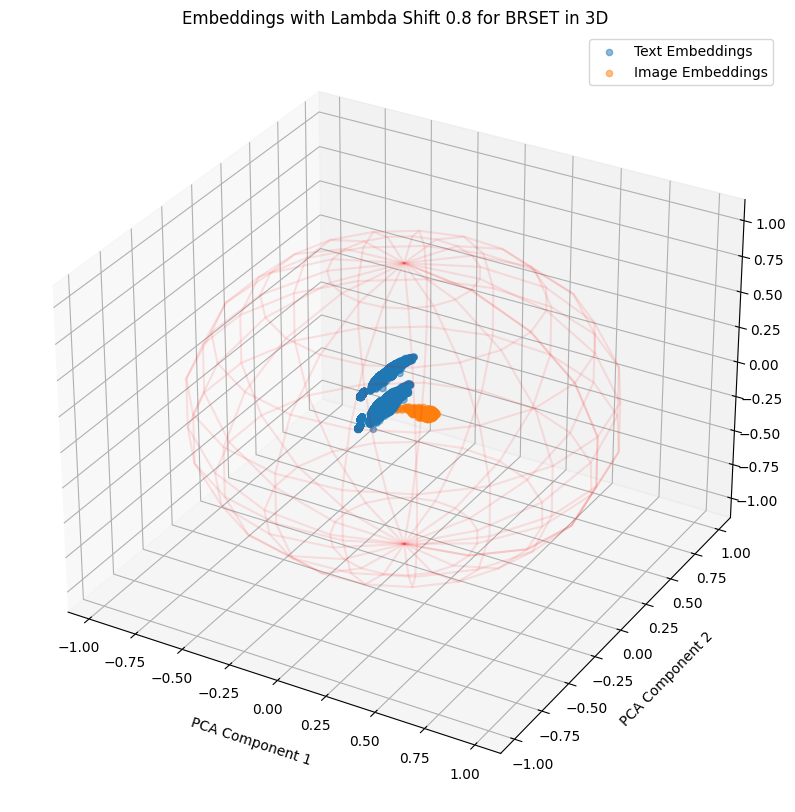

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.81 seconds
Total Training Time per Epoch: 180.58 seconds
Average Inference Time per Epoch: 0.42 seconds
Total Inference Time per Epoch: 41.79 seconds


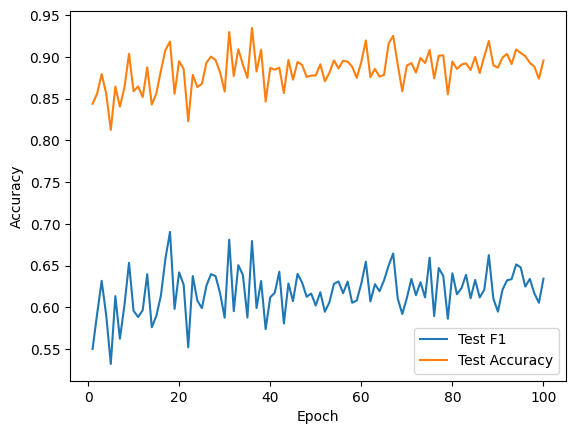

Best Accuracy: {'Acc': 0.9348494161032576, 'F1': 0.6793375328872111, 'Epoch': 36}
Best Macro-F1: {'Acc': 0.9185617701290719, 'F1': 0.6903663187467314, 'Epoch': 18}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.06 seconds
Total Training Time per Epoch: 206.31 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 43.07 seconds


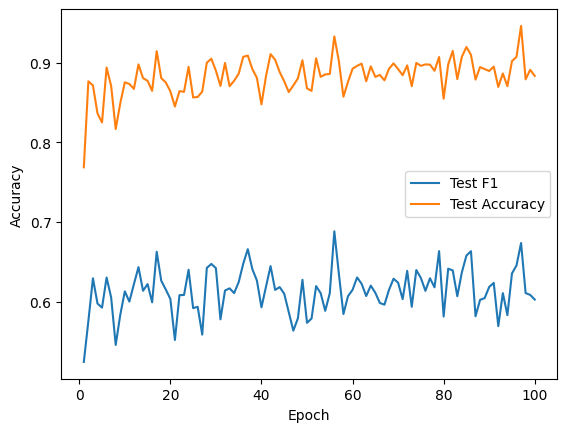

Best Accuracy: {'Acc': 0.9459127228027043, 'F1': 0.6735985050823406, 'Epoch': 97}
Best Macro-F1: {'Acc': 0.9326982175783651, 'F1': 0.6882926464160959, 'Epoch': 56}
##################################################  Shift 0.9  ##################################################


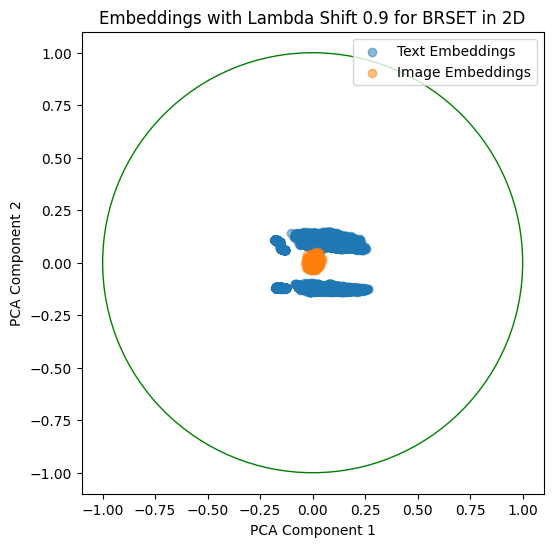

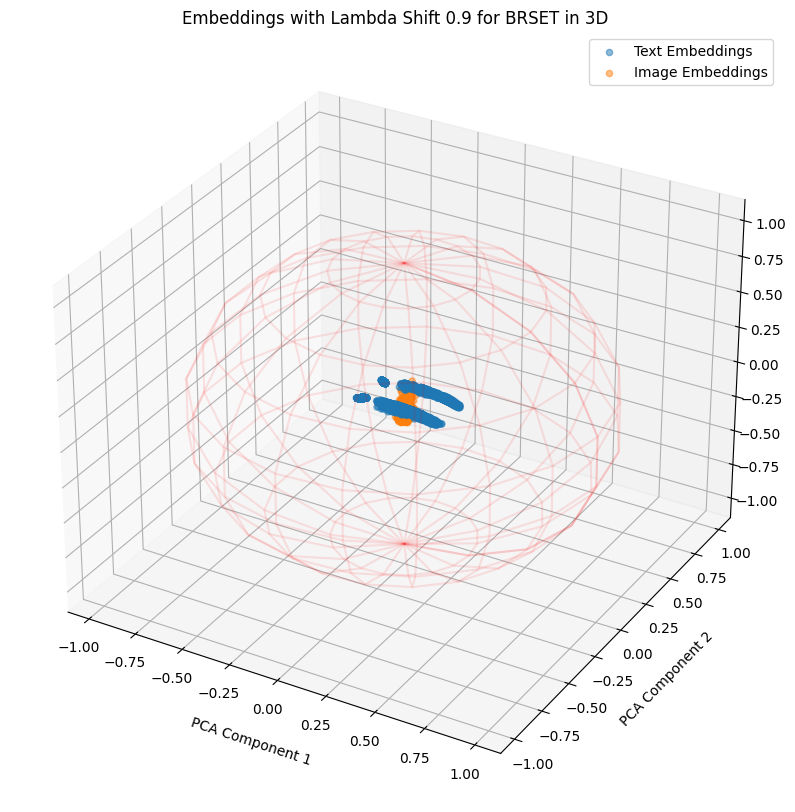

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.81 seconds
Total Training Time per Epoch: 181.04 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 43.06 seconds


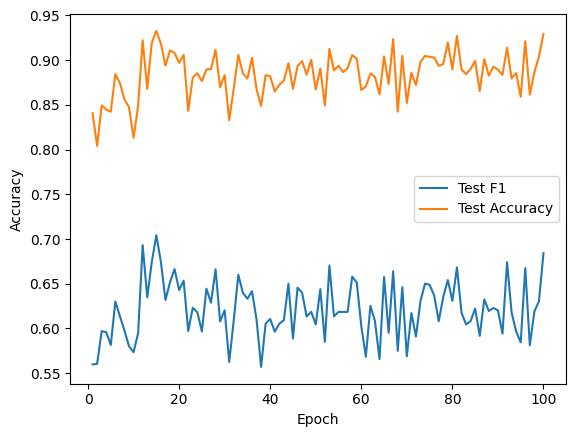

Best Accuracy: {'Acc': 0.9326982175783651, 'F1': 0.7042510299332098, 'Epoch': 15}
Best Macro-F1: {'Acc': 0.9326982175783651, 'F1': 0.7042510299332098, 'Epoch': 15}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.07 seconds
Total Training Time per Epoch: 206.61 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 43.00 seconds


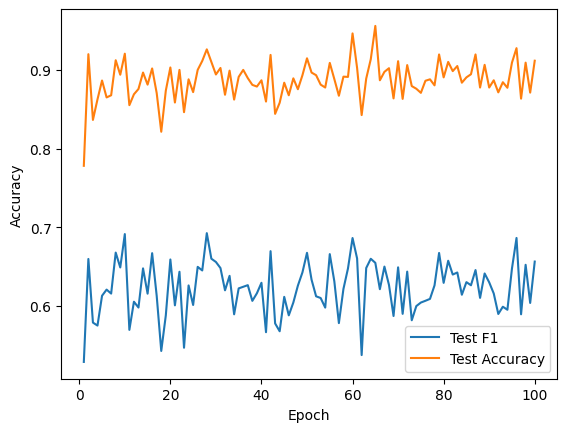

Best Accuracy: {'Acc': 0.9560540872771973, 'F1': 0.6547109192291951, 'Epoch': 65}
Best Macro-F1: {'Acc': 0.9262446220036877, 'F1': 0.6924481560882421, 'Epoch': 28}
##################################################  Shift 1  ##################################################


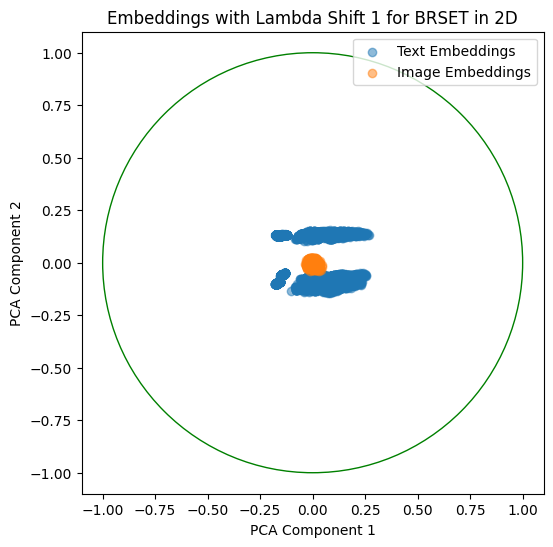

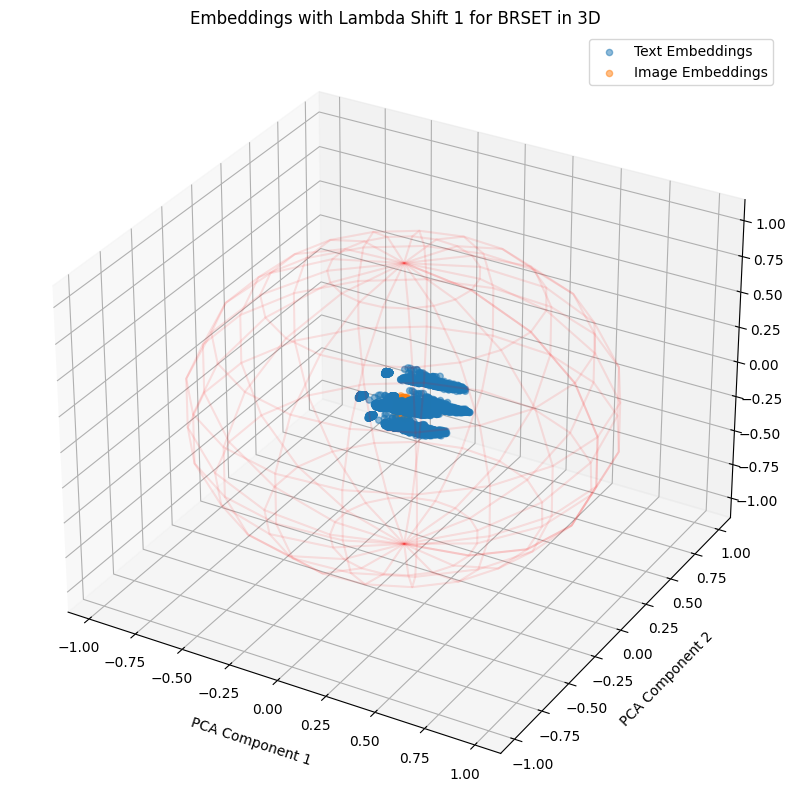

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131843
Average Training Time per Epoch: 1.78 seconds
Total Training Time per Epoch: 178.19 seconds
Average Inference Time per Epoch: 0.42 seconds
Total Inference Time per Epoch: 42.07 seconds


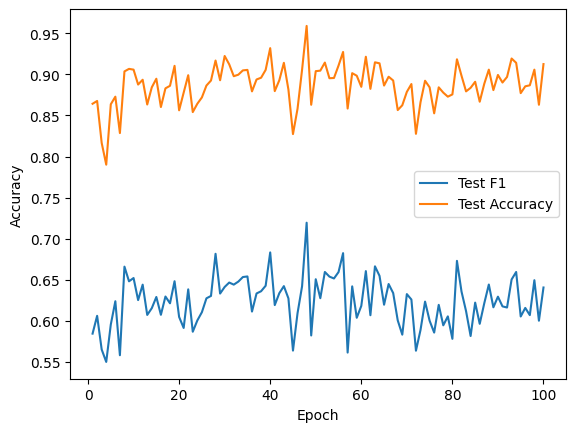

Best Accuracy: {'Acc': 0.958819913952059, 'F1': 0.7194987134909926, 'Epoch': 48}
Best Macro-F1: {'Acc': 0.958819913952059, 'F1': 0.7194987134909926, 'Epoch': 48}
Training Late Fusion Model:
The number of parameters of the model are: 66307
Average Training Time per Epoch: 2.05 seconds
Total Training Time per Epoch: 204.84 seconds
Average Inference Time per Epoch: 0.43 seconds
Total Inference Time per Epoch: 43.40 seconds


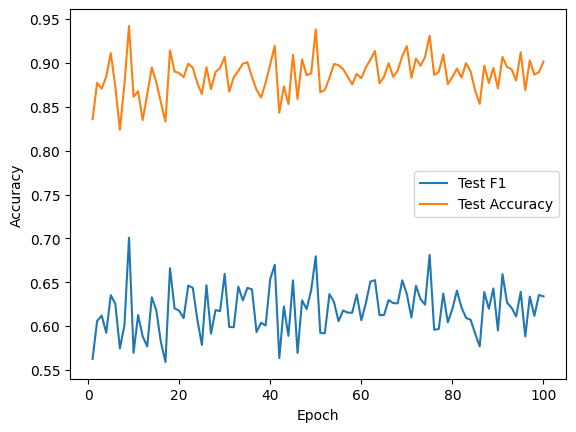

Best Accuracy: {'Acc': 0.9422249539028887, 'F1': 0.7007432242028181, 'Epoch': 9}
Best Macro-F1: {'Acc': 0.9422249539028887, 'F1': 0.7007432242028181, 'Epoch': 9}


In [6]:
# Assuming df is your DataFrame
lambda_shift_values = [-1, -0.9, -0.8, -0.7, -0.6, -0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]  # Negative values bring embeddings closer, positive values push them apart

# Normalize initial embeddings
df[text_columns] = normalize_embeddings(df[text_columns].values)
df[image_columns] = normalize_embeddings(df[image_columns].values)

# Dataframe with shifted values:
df_shifted = df.copy()

results = {}

for lambda_shift in lambda_shift_values:
    
    print('#'*50, f' Shift {lambda_shift} ', '#'*50)
    
    # Extract embeddings
    text_embeddings = df[text_columns].values
    image_embeddings = df[image_columns].values
    
    # Modify and normalize embeddings
    text_embeddings_shifted, image_embeddings_shifted = modify_and_normalize_embeddings(text_embeddings, image_embeddings, lambda_shift)
    
    # Update DataFrame with shifted embeddings
    df_shifted[text_columns] = text_embeddings_shifted
    df_shifted[image_columns] = image_embeddings_shifted
    
    # Visualize shifted embeddings
    visualize_embeddings(text_embeddings_shifted, image_embeddings_shifted, f'Embeddings with Lambda Shift {lambda_shift} for {DATASET}', lambda_shift, DATASET)
    
    # Split the data
    train_df, test_df = split_data(df_shifted)
    
    
    # Process and one-hot encode labels for training set
    train_labels, mlb, train_columns = process_labels(train_df, col=label_columns)
    test_labels = process_labels(test_df, col=label_columns, train_columns=train_columns)

    train_dataset = VQADataset(train_df, text_columns, image_columns, label_columns, mlb, train_columns)
    test_dataset = VQADataset(test_df, text_columns, image_columns, label_columns, mlb, train_columns)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    text_input_size = len(text_columns)
    image_input_size = len(image_columns)

    ### Models:

    # Train early fusion model
    print("Training Early Fusion Model:")
    accuracy, precision, recall, f1, best = train_early_fusion(train_loader, test_loader, text_input_size, image_input_size, output_size, num_epochs=num_epochs, multilabel=multilabel, report=True, V=False)
    print(f"Best Accuracy: {best['Acc']}")
    print(f"Best Macro-F1: {best['Macro-F1']}")
    
    results[f"early_({lambda_shift})"] = best
    
    # Train late fusion model
    print("Training Late Fusion Model:")
    accuracy, precision, recall, f1, best = train_late_fusion(train_loader, test_loader, text_input_size, image_input_size, output_size, num_epochs=num_epochs, multilabel=multilabel, report=True, V=False)
    print(f"Best Accuracy: {best['Acc']}")
    print(f"Best Macro-F1: {best['Macro-F1']}")
    
    results[f"late_({lambda_shift})"] = best

In [7]:
print('Results Early Fusion: ')
for lambda_shift in lambda_shift_values:
    print(f'Shift = {lambda_shift}')
    print(f"Best Accuracy: {results[f'early_({lambda_shift})']['Acc']}")
    print(f"Best F1: {results[f'early_({lambda_shift})']['Macro-F1']}")
    
print('Results Late Fusion: ')
for lambda_shift in lambda_shift_values:
    print(f'Shift = {lambda_shift}')
    print(f"Best Accuracy: {results[f'late_({lambda_shift})']['Acc']}")
    print(f"Best F1: {results[f'late_({lambda_shift})']['Macro-F1']}")

Results Early Fusion: 
Shift = -1
Best Accuracy: {'Acc': 0.942839582052858, 'F1': 0.6955752263017585, 'Epoch': 57}
Best F1: {'Acc': 0.9363859864781807, 'F1': 0.711777704185021, 'Epoch': 30}
Shift = -0.9
Best Accuracy: {'Acc': 0.9434542102028273, 'F1': 0.7180596228786348, 'Epoch': 67}
Best F1: {'Acc': 0.9434542102028273, 'F1': 0.7180596228786348, 'Epoch': 67}
Shift = -0.8
Best Accuracy: {'Acc': 0.9416103257529195, 'F1': 0.7069902447984334, 'Epoch': 99}
Best F1: {'Acc': 0.9416103257529195, 'F1': 0.7069902447984334, 'Epoch': 99}
Shift = -0.7
Best Accuracy: {'Acc': 0.9413030116779348, 'F1': 0.7045626787086503, 'Epoch': 93}
Best F1: {'Acc': 0.9413030116779348, 'F1': 0.7045626787086503, 'Epoch': 93}
Shift = -0.6
Best Accuracy: {'Acc': 0.9280885064535955, 'F1': 0.6778497068202544, 'Epoch': 79}
Best F1: {'Acc': 0.9228641671788568, 'F1': 0.6905573563293267, 'Epoch': 6}
Shift = -0.5
Best Accuracy: {'Acc': 0.9471419791026429, 'F1': 0.7097316471253493, 'Epoch': 19}
Best F1: {'Acc': 0.9471419791026

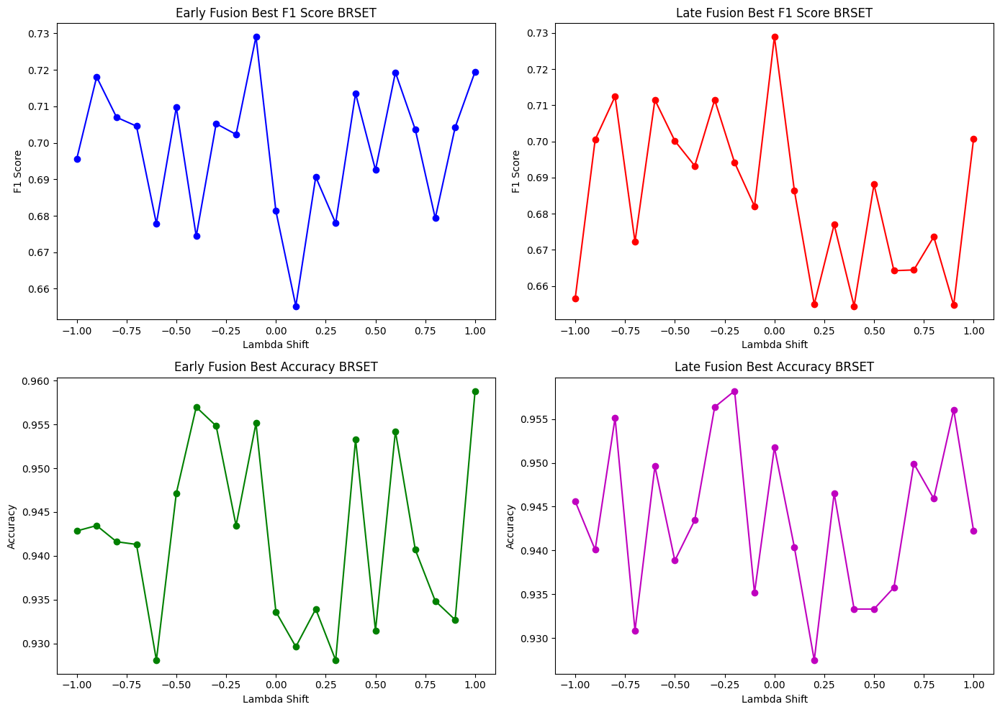

In [8]:
plot_results(results, lambda_shift_values, DATASET)